## Rainfall Weather Forecasting

### Project Description

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement:<br>
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.<br>
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:<br>
Number of columns: 23

Date  - The date of observation<br>
Location  -The common name of the location of the weather station<br>
MinTemp  -The minimum temperature in degrees celsius<br>
MaxTemp -The maximum temperature in degrees celsius<br>
Rainfall  -The amount of rainfall recorded for the day in mm<br>
Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am<br>
Sunshine  -The number of hours of bright sunshine in the day.<br>
WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight<br>
WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight<br>
WindDir9am -Direction of the wind at 9am<br>
WindDir3pm -Direction of the wind at 3pm<br>
WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am<br>
WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm<br>
Humidity9am -Humidity (percent) at 9am<br>
Humidity3pm -Humidity (percent) at <br>
Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am<br>
Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm<br>
Cloud9am - Fraction of sky obscured by cloud at 9am.<br> 
Cloud3pm -Fraction of sky obscured by cloud<br>
Temp9am-Temperature (degrees C) at 9am<br>
Temp3pm -Temperature (degrees C) at 3pm<br>
RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0<br>
RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


### Dataset Link

- https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv
- https://github.com/dsrscientist/dataset3

### Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings 
warnings.filterwarnings('ignore')

### Loading the dataset

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


From above we can observe a combination of numeric and categorical data.<br>
There are two target variables: RainTomorrow and Rainfall.<br>
RainTomorrow is a categorical variable with values Yes or No. Hence this is a classification task. <br>
Rainfall is a numerical variable with continuous values. So, this is a regression task.

### Exploratory Data Analysis

In [3]:
# Getting dimensions od the dataset
df.shape

(8425, 23)

The dataset consists of 8425 rows and 23 columns, out of which 2 columns are target or output variables.

In [4]:
# Getting the column names
df.columns.to_list()

['Date',
 'Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday',
 'RainTomorrow']

*For Classification:*<br>
The independent variables are:<br>
'Date',
 'Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday'

The target variable is:<br>
'RainTomorrow'

<br>

*For Regression:*<br>
The independent variables are:<br>
'Date',
 'Location',
 'MinTemp',
 'MaxTemp',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday',
 'RainTomorrow'


The target variable is:<br>
'Rainfall'

In [5]:
# Checking datatype of each column
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

The dataset has float64 and object datatypes, indicating numeric and string datatypes.<br>
The date column shouls ideally have datatype as datetime, not object and needs to be converted.

In [6]:
# Checking for missing values
df.isna().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

There are several missing values in the dataset which need to be handled during data preprocessing.

In [7]:
# Checking for duplicates
df.duplicated().sum()

1663

There are 1663 duplicates in the dataset. We need to remove the duplicates.

In [8]:
#Removing duplicates
df.drop_duplicates(inplace=True)

In [9]:
df.shape

(6762, 23)

After removing duplicates, the number of rows is now 6762.

In [10]:
# Getting information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6762 non-null   object 
 1   Location       6762 non-null   object 
 2   MinTemp        6692 non-null   float64
 3   MaxTemp        6705 non-null   float64
 4   Rainfall       6624 non-null   float64
 5   Evaporation    3841 non-null   float64
 6   Sunshine       3526 non-null   float64
 7   WindGustDir    5820 non-null   object 
 8   WindGustSpeed  5820 non-null   float64
 9   WindDir9am     5968 non-null   object 
 10  WindDir3pm     6468 non-null   object 
 11  WindSpeed9am   6699 non-null   float64
 12  WindSpeed3pm   6662 non-null   float64
 13  Humidity9am    6708 non-null   float64
 14  Humidity3pm    6666 non-null   float64
 15  Pressure9am    5454 non-null   float64
 16  Pressure3pm    5451 non-null   float64
 17  Cloud9am       4896 non-null   float64
 18  Cloud3pm

From above, we can get an overview of the dataset. As observed before, there are still missing values, even after removing duplicates.

In [11]:
# Converting Date to datetime from object
df['Date'] = pd.to_datetime(df['Date'])

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           6762 non-null   datetime64[ns]
 1   Location       6762 non-null   object        
 2   MinTemp        6692 non-null   float64       
 3   MaxTemp        6705 non-null   float64       
 4   Rainfall       6624 non-null   float64       
 5   Evaporation    3841 non-null   float64       
 6   Sunshine       3526 non-null   float64       
 7   WindGustDir    5820 non-null   object        
 8   WindGustSpeed  5820 non-null   float64       
 9   WindDir9am     5968 non-null   object        
 10  WindDir3pm     6468 non-null   object        
 11  WindSpeed9am   6699 non-null   float64       
 12  WindSpeed3pm   6662 non-null   float64       
 13  Humidity9am    6708 non-null   float64       
 14  Humidity3pm    6666 non-null   float64       
 15  Pressure9am    5454 n

We can now see that the datatype for Date is datetime64 instead of object.

In [13]:
# Number of unique values for each variable
df.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

- From above it is clear that Location, WindGustDir, WindDir9am, WindDir3pm, RainToday, and RainTomorrow (target) are categorical variables.<br>
- MinTemp, MaxTemp, Rainfall (target), Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am and Temp3pm are numeric and continuous variables.
- Based on number of unique values, we can conclude that the rainfall is recorded for 3004 different days and 12 different locations.

In [14]:
# Frequency of occurence of each value in 'Location' column
df.Location.value_counts()

PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64

PerthAirport seems to be the most frequently ocuring location whereas Uluru is the least frequent location.

In [15]:
# Frequency of occurence of each value in 'WindGustDir' column
df.WindGustDir.value_counts()

E      518
SW     465
N      459
W      434
WSW    420
WNW    398
SSE    390
S      376
SE     370
ENE    357
NE     300
SSW    299
NW     296
NNE    287
ESE    267
NNW    184
Name: WindGustDir, dtype: int64

The WindGUStDir is E (East) majority of the times.

In [16]:
# Frequency of occurence of each value in 'WindDir9am' column
df.WindDir9am.value_counts()

N      609
SW     590
NW     463
SE     439
ENE    397
WSW    394
SSW    368
NE     364
E      338
NNE    337
S      324
WNW    301
SSE    300
W      299
ESE    229
NNW    216
Name: WindDir9am, dtype: int64

The WindDir9am is most frequently N (North).

In [17]:
# Frequency of occurence of each value in 'WindDir3pm' column
df.WindDir3pm.value_counts()

SE     677
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: WindDir3pm, dtype: int64

Most of the times WindDir3pm is SE (South-East).

In [18]:
# Frequency of occurence of each value in 'RainToday' column
df.RainToday.value_counts()

No     5052
Yes    1572
Name: RainToday, dtype: int64

Most of the days there is no or less than 1mm Rainfall.

In [19]:
# Frequency of occurence of each value in 'RainTomorrow' column
df.RainTomorrow.value_counts()

No     5052
Yes    1572
Name: RainTomorrow, dtype: int64

Most of the days there is no or less than 1mm Rainfall the next day.

#### Dataset description

In [20]:
# Statistical summary of columns (numerical data)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,6692.0,13.109145,5.569574,-2.0,9.0,13.2,17.5,28.5
MaxTemp,6705.0,24.098345,6.156128,8.2,19.5,23.5,28.4,45.5
Rainfall,6624.0,2.780148,10.591418,0.0,0.0,0.0,0.8,371.0
Evaporation,3841.0,5.302395,4.436790,0.0,2.6,4.6,7.0,145.0
Sunshine,3526.0,7.890896,3.785883,0.0,5.4,9.0,10.8,13.9
WindGustSpeed,5820.0,38.977663,14.418577,7.0,30.0,37.0,48.0,107.0
WindSpeed9am,6699.0,12.782206,9.833499,0.0,6.0,11.0,19.0,63.0
WindSpeed3pm,6662.0,17.571150,9.620043,0.0,9.0,17.0,24.0,83.0
Humidity9am,6708.0,67.506559,17.251733,10.0,56.0,68.0,81.0,100.0
Humidity3pm,6666.0,50.467147,18.631086,6.0,38.0,50.0,63.0,99.0


Observations from the statistical summary:
- The mean is slightly greater than median for MaxTemp, WindSpeed3pm, Humidity3pm and Temp3pm.
- The mean is greater than the median for Rainfall, Evaporation, WindGustSpeed, and WindSpeed9am. So these variables are skewed to the right.
- The mean is slightly less than the median for MinTemp, Humidity9am, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, and Temp9am.
- The mean is less than the median for Sunshine, meaning it is quite skewed to the left.
- Based on the 75% and max values, there seem to be outliers for certain variables as well.

In [21]:
# Numeric columns for data visualisation
num_cols = df.drop(columns=['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow'])
num_cols.columns.to_list()

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

#### Data Visualisation

In [22]:
# Setting uniform color palette
sns.set_palette(sns.color_palette("vlag"))

##### Univariate analysis

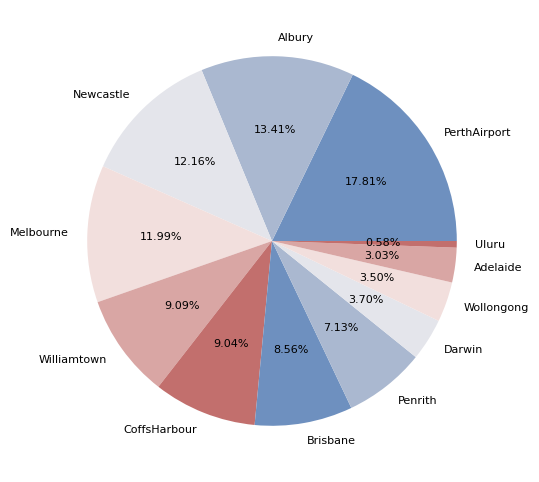

In [23]:
# Visualising the Location in a pie-chart

plt.figure(figsize=(6, 6))
palette_color = sns.color_palette('vlag')
  
plt.pie(df.Location.value_counts(), 
        labels=df.Location.value_counts().index,
        colors=palette_color, 
        autopct='%.2f%%',
        textprops={'fontsize': 8})
plt.show()

Perth Airport seems to occur the most in the dataset.

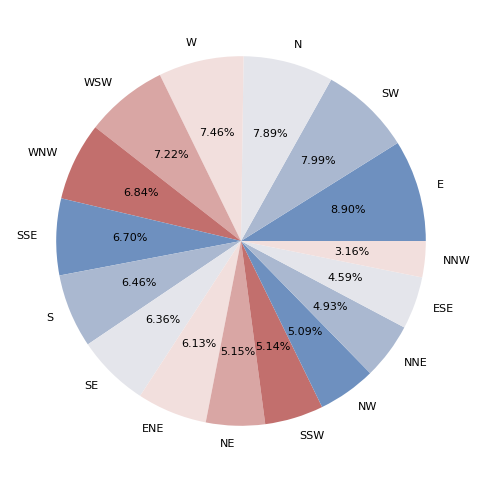

In [24]:
# Visualising the WindGustDir in a pie-chart

plt.figure(figsize=(6, 6))
palette_color = sns.color_palette('vlag')
  
plt.pie(df.WindGustDir.value_counts(), 
        labels=df.WindGustDir.value_counts().index,
        colors=palette_color, 
        autopct='%.2f%%',
        textprops={'fontsize': 8})
plt.show()

The wind gust direction in most often East (E).

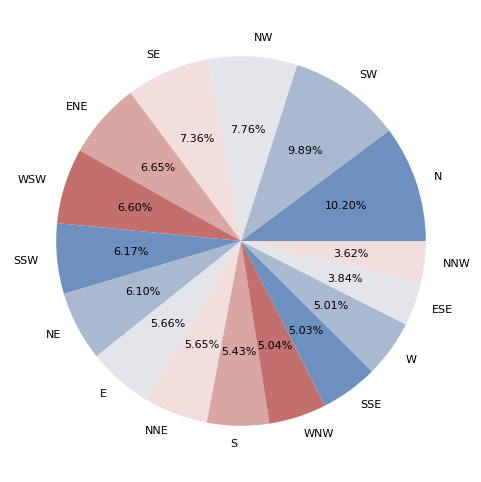

In [25]:
# Visualising the WindDir9am in a pie-chart

plt.figure(figsize=(6, 6))
palette_color = sns.color_palette('vlag')
  
plt.pie(df.WindDir9am.value_counts(), 
        labels=df.WindDir9am.value_counts().index,
        colors=palette_color, 
        autopct='%.2f%%',
        textprops={'fontsize': 8})
plt.show()

The wind direction at 9am in most often North (N).

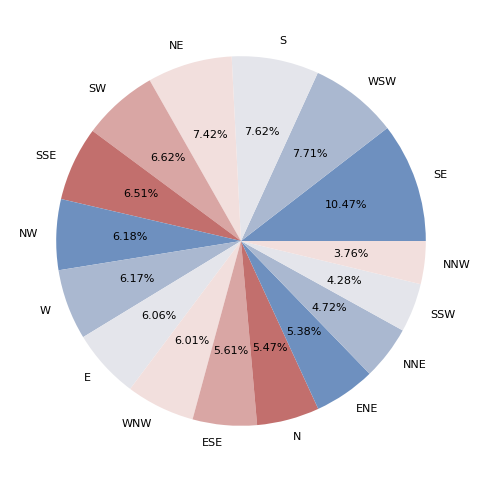

In [26]:
# Visualising the WindDir3pm in a pie-chart

plt.figure(figsize=(6, 6))
palette_color = sns.color_palette('vlag')
  
plt.pie(df.WindDir3pm.value_counts(), 
        labels=df.WindDir3pm.value_counts().index,
        colors=palette_color, 
        autopct='%.2f%%',
        textprops={'fontsize': 8})
plt.show()

The wind direction at 3pm in most often South-East (SE).

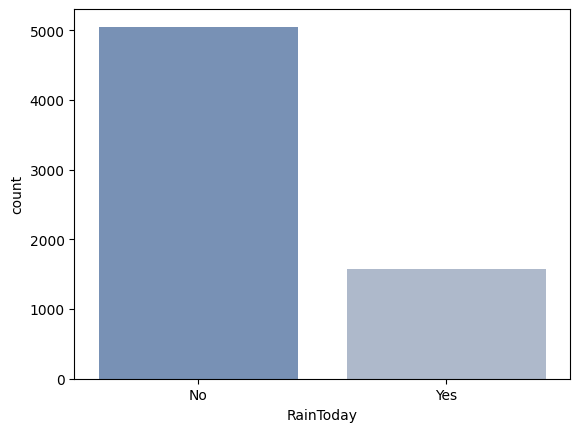

In [27]:
# Visualising the frequency of RainToday in the dataset
sns.countplot(x=df.RainToday)
plt.show()

Majority of the days there is less than 1mm or no rainfall.

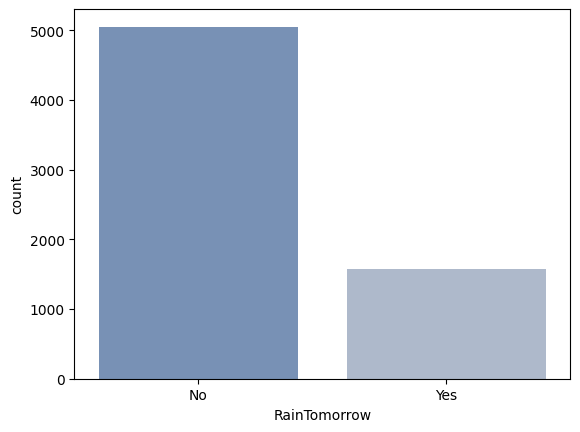

In [28]:
# Visualising the frequency of RainTomorrow in the dataset
sns.countplot(x=df.RainTomorrow)
plt.show()

Majority of the days there is less than 1mm or no rainfall the next day.

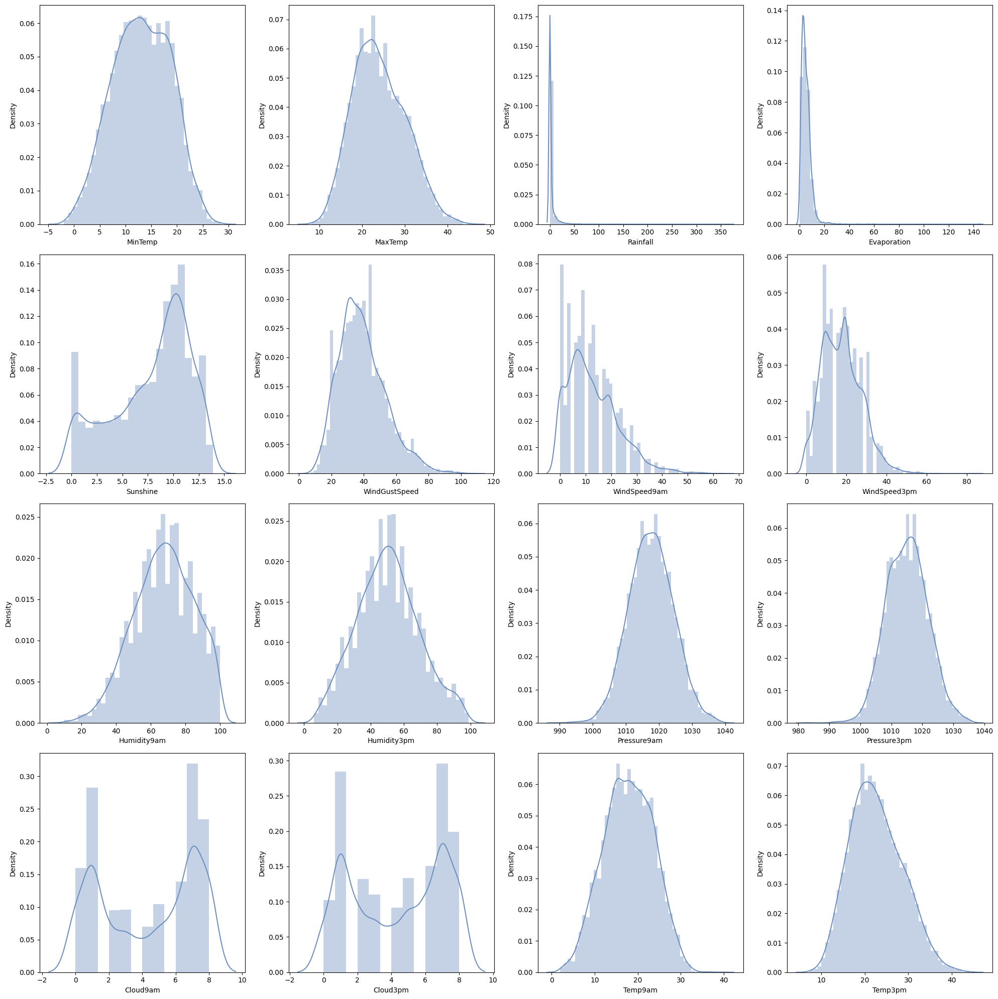

In [29]:
# Data distribution for numerical columns
plt.figure(figsize=(20, 20))
plot_num = 1
for col in num_cols:
    if plot_num <= 16:
        ax = plt.subplot(4, 4, plot_num)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

- There is high positive skewness observed for Rainfall, Evaporation, WindGustSpeed, and WindSpeed9am
- There is high negative skewness observed for Sunshine.
- Rest of the variables seem to have an almost normal distribution

##### Bivariate analysis

###### RainTomorrow vs other variables

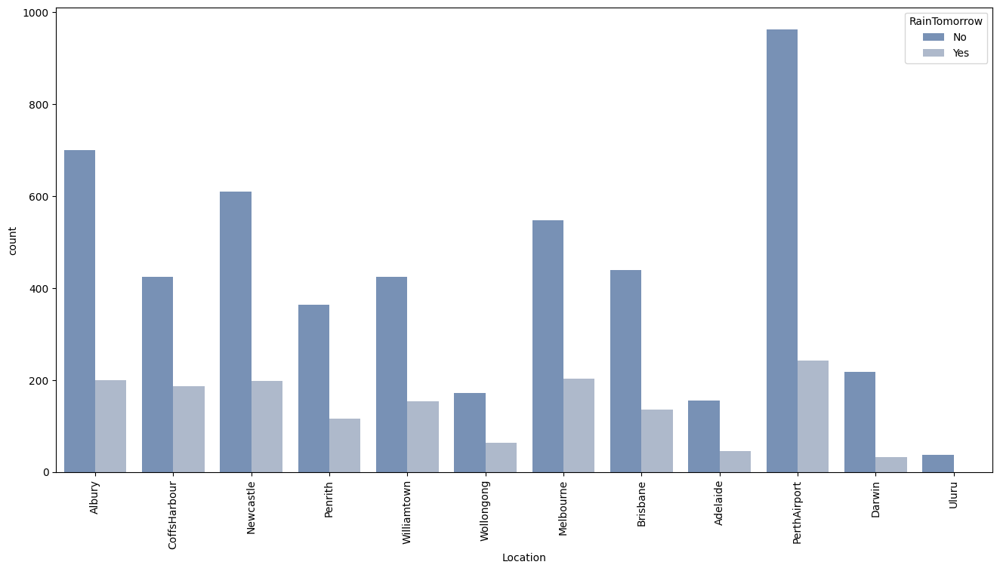

In [30]:
# Location vs RainTomorrow
plt.figure(figsize=(16, 8))
sns.countplot(x='Location', hue='RainTomorrow', data=df)
plt.xticks(rotation=90)
plt.show()

The maximum number of times rainfall occurred the next day, the location was PerthAirport, Melbourne, New castle or Albury.

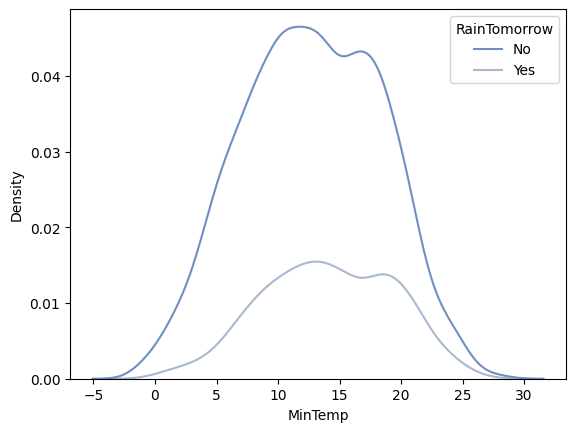

In [31]:
# MinTemp vs RainTomorrow
sns.kdeplot(x="MinTemp", data=df, hue="RainTomorrow")
plt.show()

The MinTemp values peak at slightly higher temperature if there is rainfall the next day compared to if there is no rainfall the next day.

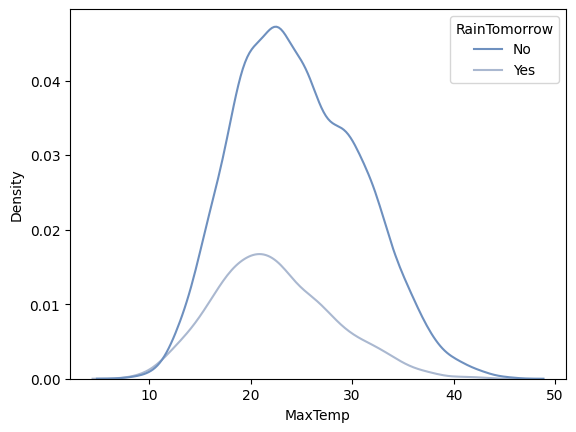

In [32]:
# MaxTemp vs RainTomorrow
sns.kdeplot(x="MaxTemp", data=df, hue="RainTomorrow")
plt.show()

The MaxTemp values peak at slightly lower temperature if there is rainfall the next day compared to if there is no rainfall the next day.

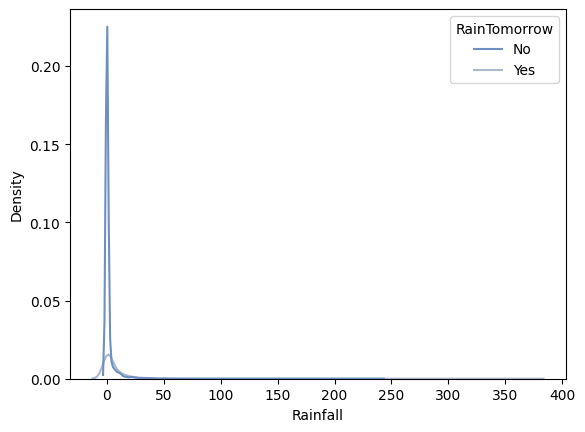

In [33]:
# Rainfall vs RainTomorrow
sns.kdeplot(x="Rainfall", data=df, hue="RainTomorrow")
plt.show()

The Rainfall values have a high peak at very low values of rainfall if there is no rain the next day. If there is rain the next day, then rainfall values seem to be slightly higher.

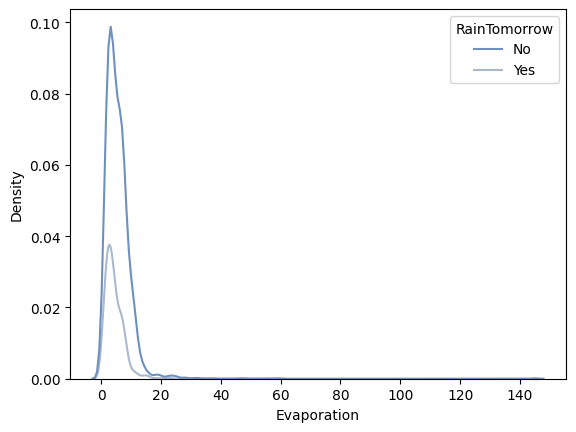

In [34]:
# Evaporation vs RainTomorrow
sns.kdeplot(x="Evaporation", data=df, hue="RainTomorrow")
plt.show()

Evaporation seems to follow a similar distribution for both rain and no rain the next day. However the Evaporation values seem slightly lower if there is rain the next day.

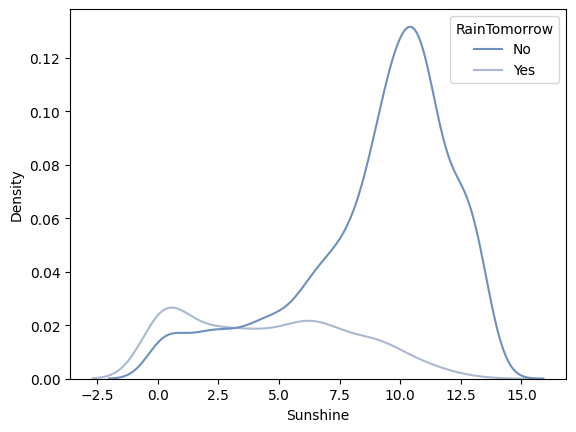

In [35]:
# Sunshine vs RainTomorrow
sns.kdeplot(x="Sunshine", data=df, hue="RainTomorrow")
plt.show()

For next day rain, Sunshine peak at very low values, indicating less sunshine when there is rain next day.<br>
For no rain next day, Sunshine peaks at high values, which means if there is a lot of sunshine, it is less likely to rain the next day.

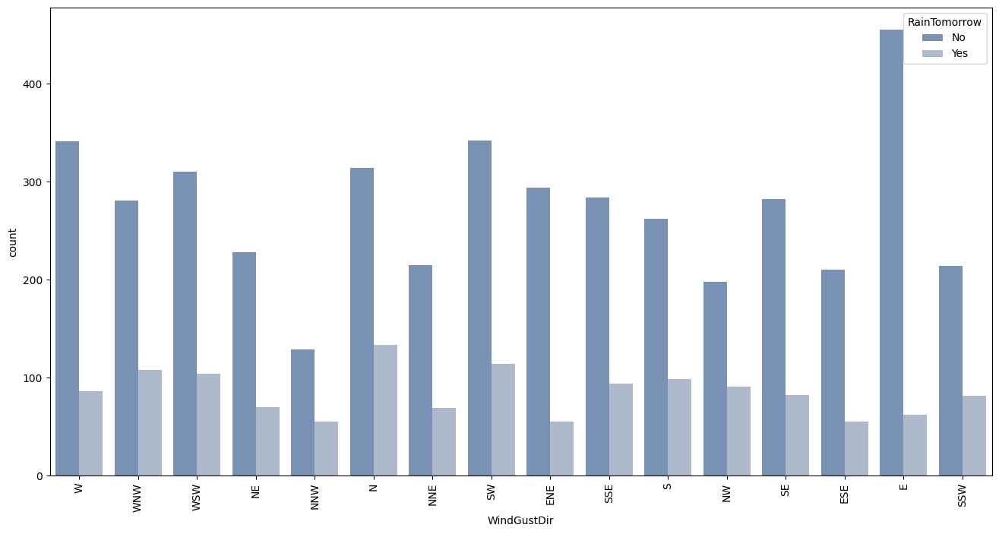

In [36]:
# WindGustDir vs RainTomorrow
plt.figure(figsize=(16, 8))
sns.countplot(x='WindGustDir', hue='RainTomorrow', data=df)
plt.xticks(rotation=90)
plt.show()

The maximum number of times rainfall occurred the next day, the wind gust direction was North, followed by South West.

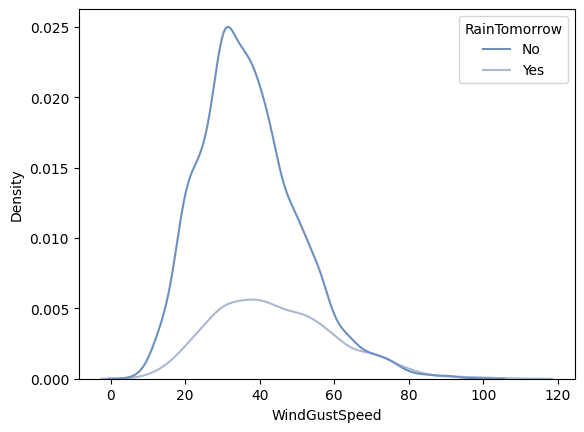

In [37]:
# WindGustSpeed vs RainTomorrow
sns.kdeplot(x="WindGustSpeed", data=df, hue="RainTomorrow")
plt.show()

For next day rain, the wind gust speed seems to have a broad peak at slightly higher speed values compared to days with no rain on the next day.

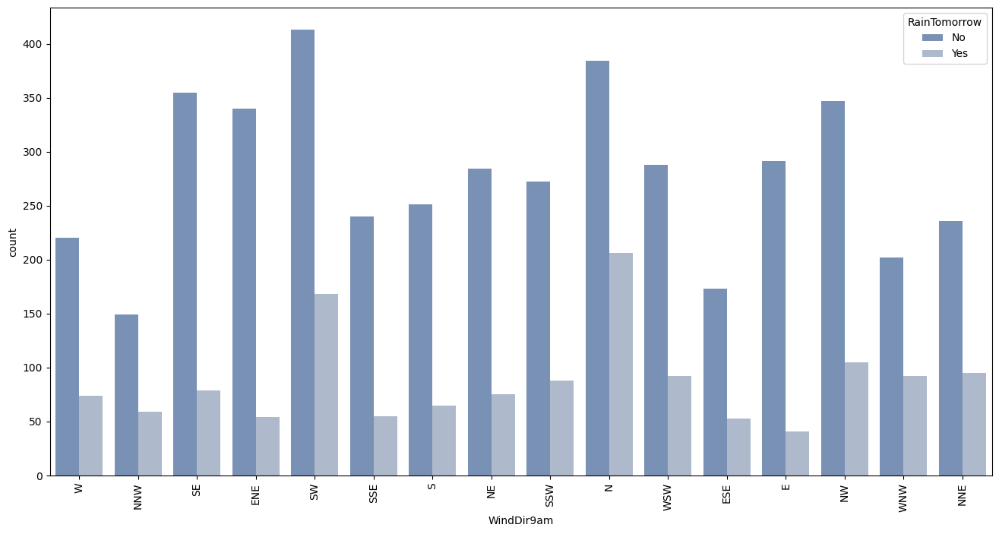

In [38]:
# WindDir9am vs RainTomorrow
plt.figure(figsize=(16, 8))
sns.countplot(x='WindDir9am', hue='RainTomorrow', data=df)
plt.xticks(rotation=90)
plt.show()

The maximum number of times rainfall occurred the next day, the wind direction at 9am was North, followed by South West.

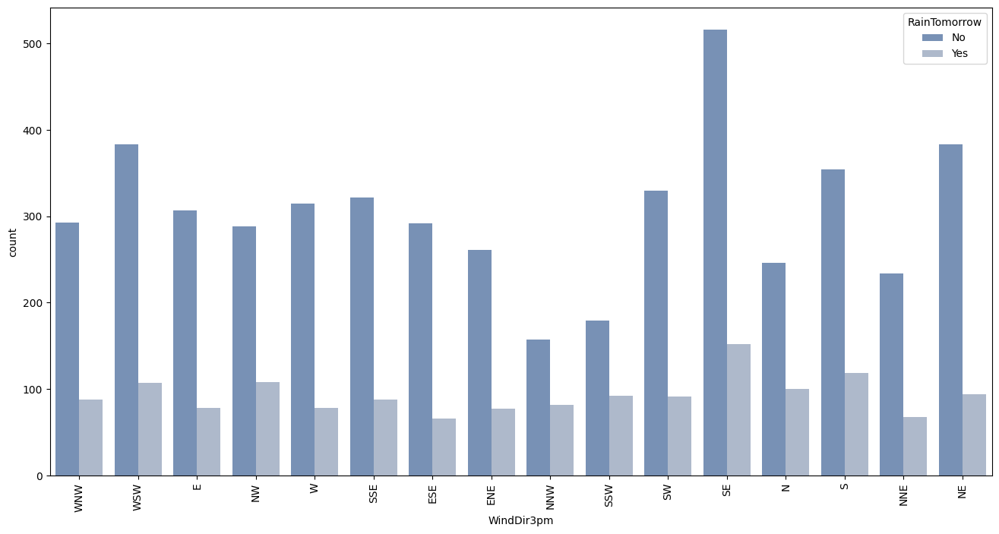

In [39]:
# WindDir3pm vs RainTomorrow
plt.figure(figsize=(16, 8))
sns.countplot(x='WindDir3pm', hue='RainTomorrow', data=df)
plt.xticks(rotation=90)
plt.show()

The maximum number of times rainfall occurred the next day, the wind direction at 3pm was South East, followed by South.

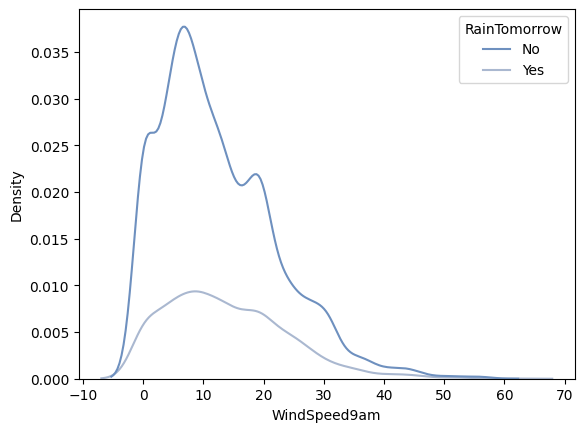

In [40]:
# WindSpeed9am vs RainTomorrow
sns.kdeplot(x="WindSpeed9am", data=df, hue="RainTomorrow")
plt.show()

The wind speed at 9am sems to peak arond the same speed for both Yes and No values of RainTomorrow. However, if there is rain the next day, the peak is broader indicatiing a broader range of wind speeds if there is rainfall the next day.

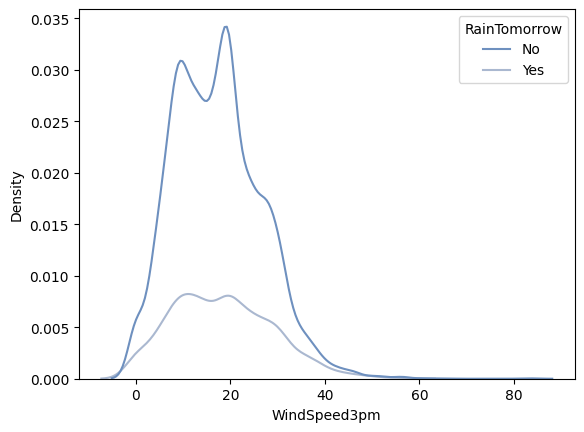

In [41]:
# WindSpeed3pm vs RainTomorrow
sns.kdeplot(x="WindSpeed3pm", data=df, hue="RainTomorrow")
plt.show()

For no rain next day, the wind speed at 3pm seems to have two peaks, one around 10 and the other around 25.<br>
For next day rain, the wind speed at 3 pm seemed to peak right before 20 and again after 20.

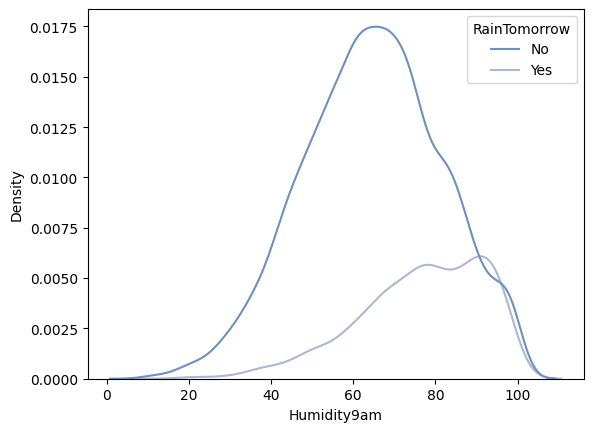

In [42]:
# Humidity9am vs RainTomorrow
sns.kdeplot(x="Humidity9am", data=df, hue="RainTomorrow")
plt.show()

For next day rain, the humidity at 9am is a lot higher than for no rain next day.

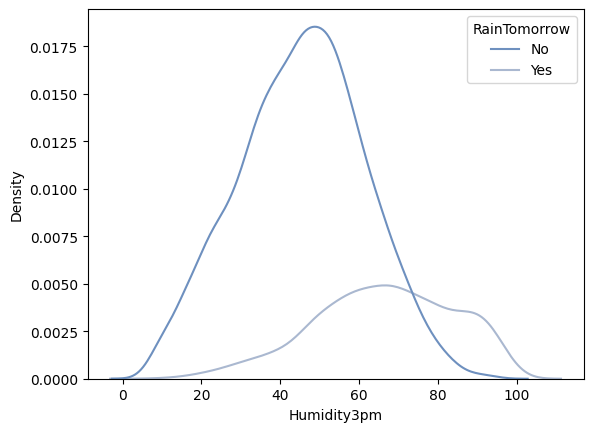

In [43]:
# Humidity3pm vs RainTomorrow
sns.kdeplot(x="Humidity3pm", data=df, hue="RainTomorrow")
plt.show()

For next day rain, the humidity at 3pm is also higher than if there is no rain next day.

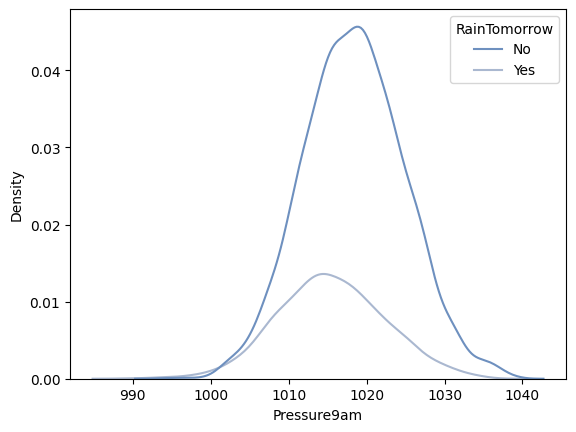

In [44]:
# Pressure9am vs RainTomorrow
sns.kdeplot(x="Pressure9am", data=df, hue="RainTomorrow")
plt.show()

For next day rain, the pressure at 9am seems to peak at slightly lower pressure compared to days with no rain on the next day.

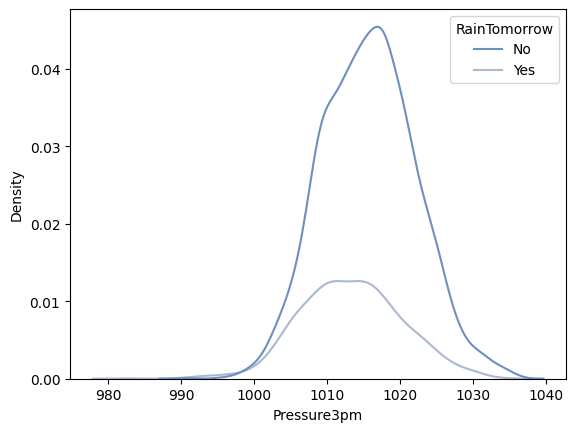

In [45]:
# Pressure3pm vs RainTomorrow
sns.kdeplot(x="Pressure3pm", data=df, hue="RainTomorrow")
plt.show()

The pressure at 3pm also peaks at lower values for days where there is rain the next day, compared to days with no rain the next day.

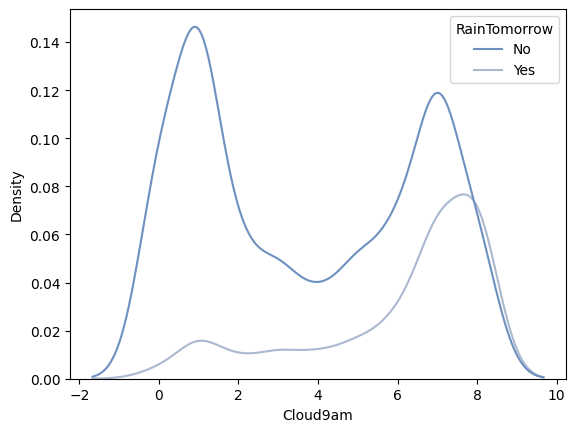

In [46]:
# Cloud9am vs RainTomorrow
sns.kdeplot(x="Cloud9am", data=df, hue="RainTomorrow")
plt.show()

The cloud cover at 9am seems to be high for days when there is rain the next day. Although high cloud cover is also observed for some days when there is no rain the next day.

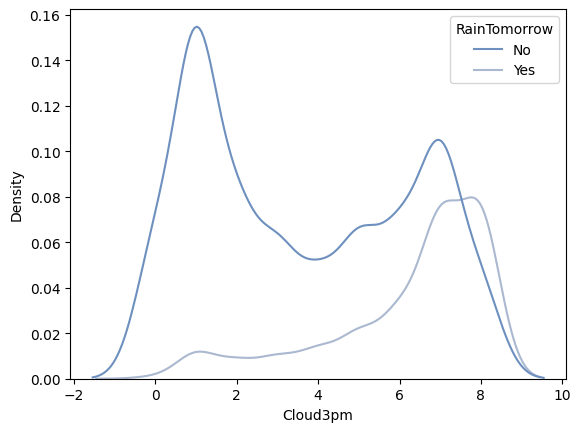

In [47]:
# Cloud3pm vs RainTomorrow
sns.kdeplot(x="Cloud3pm", data=df, hue="RainTomorrow")
plt.show()

The cloud cover at 3pm distribution is similar to cloud cover at 9am. If there is rain the next day, the cloud cover values seem to be higher in general.

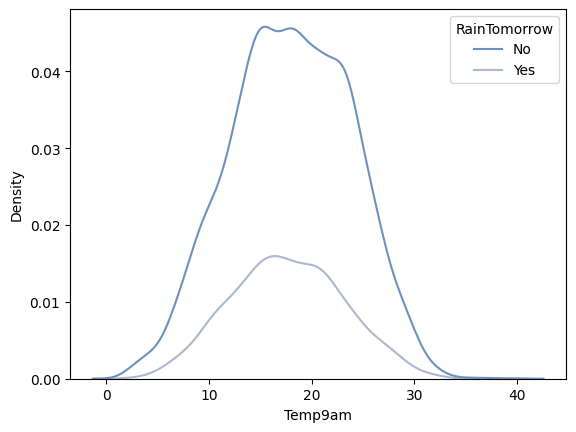

In [48]:
# Temp9am vs RainTomorrow
sns.kdeplot(x="Temp9am", data=df, hue="RainTomorrow")
plt.show()

The temperature at 9am seems to have a narrower peak for days when there is rain the next day.

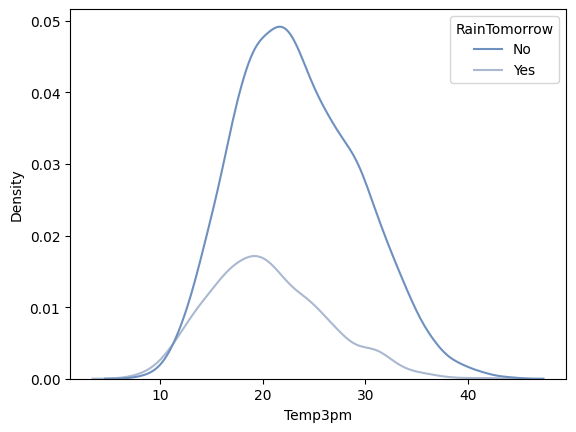

In [49]:
# Temp3pm vs RainTomorrow
sns.kdeplot(x="Temp3pm", data=df, hue="RainTomorrow")
plt.show()

The temperature at 3pm seems to be slightly lower for days when there is rain the next day compared to when there is no rain the day.

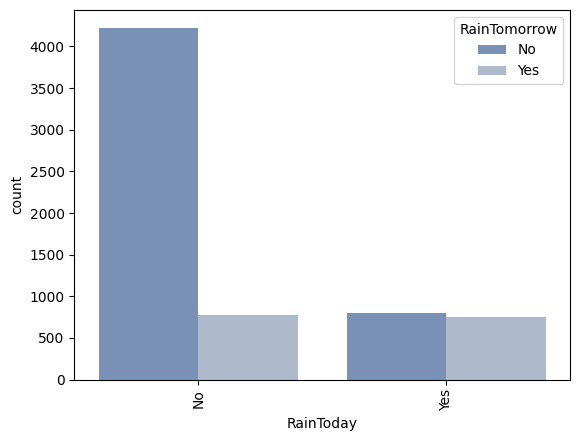

In [50]:
# RainToday vs RainTomorrow
sns.countplot(x='RainToday', hue='RainTomorrow', data=df)
plt.xticks(rotation=90)
plt.show()

Number of days it rained the next when there was rain on the given day seems to be quite close to the number of days it rained the next day when there was no rain on the given day.<br>
Majority of the days did not see any rain the next day if there was no rain the previous day.

###### Rainfall vs other variables

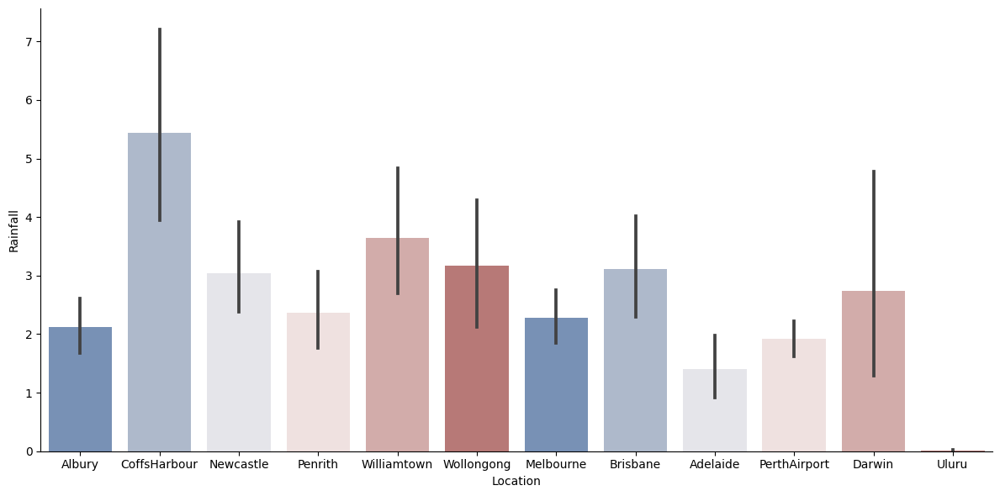

In [51]:
# Location vs Rainfall
sns.catplot(x='Location', y='Rainfall', data=df, height=6, aspect=12/6, kind='bar', palette=sns.color_palette('vlag'))
plt.show()

On average, Coffsharbour experienced the maximum rainfall in a day.

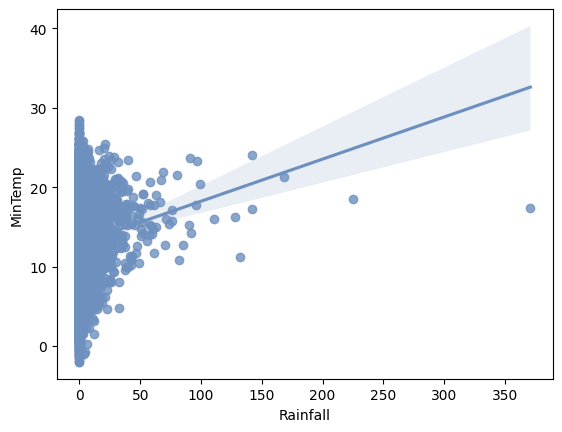

In [52]:
# MinTemp vs Rainfall
sns.regplot(x='Rainfall', y='MinTemp', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be positive correlation between Rainfall and MinTemp, indicating increase in MinTemp results in higher rain.

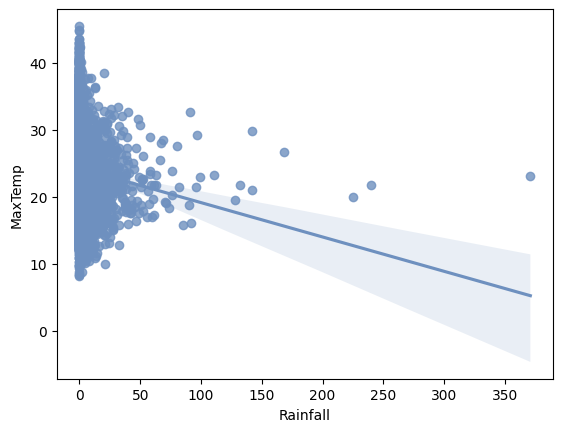

In [53]:
# MaxTemp vs Rainfall
sns.regplot(x='Rainfall', y='MaxTemp', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be negative correlation between Rainfall and MaxTemp, indicating decrease in MaxTemp results in higher rain.

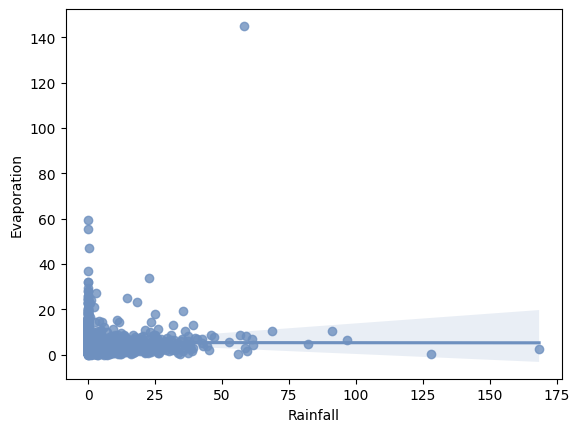

In [54]:
# Evaporation vs Rainfall
sns.regplot(x='Rainfall', y='Evaporation', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be almost no relationship between Rainfall and Evaporation.

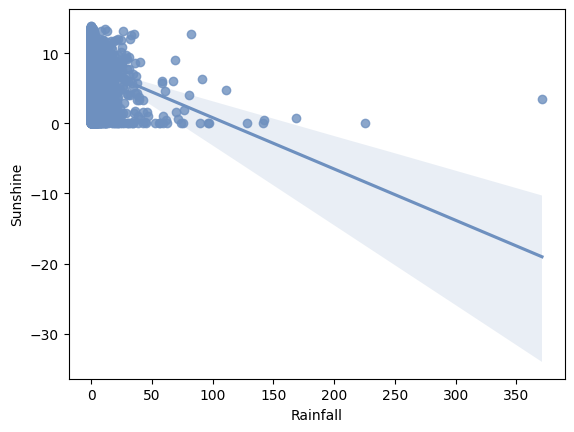

In [55]:
# Sunshine vs Rainfall
sns.regplot(x='Rainfall', y='Sunshine', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be negative correlation between Rainfall and Sunshine, indicating increase in Sunshine results in lower rain and vice versa.

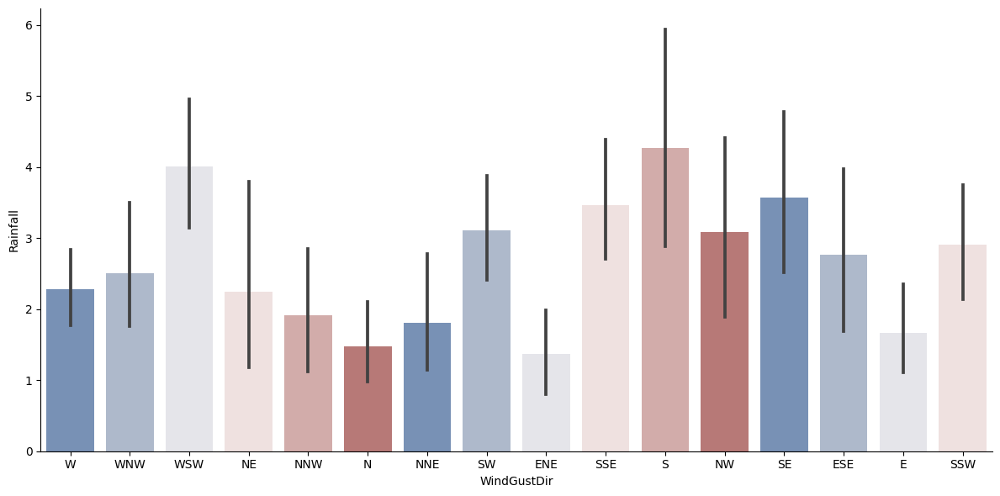

In [56]:
# WindGustDir vs Rainfall
sns.catplot(x='WindGustDir', y='Rainfall', data=df, height=6, aspect=12/6, kind='bar', palette=sns.color_palette('vlag'))
plt.show()

Rainfall seems to be higher on average when Wind gust direction is South.

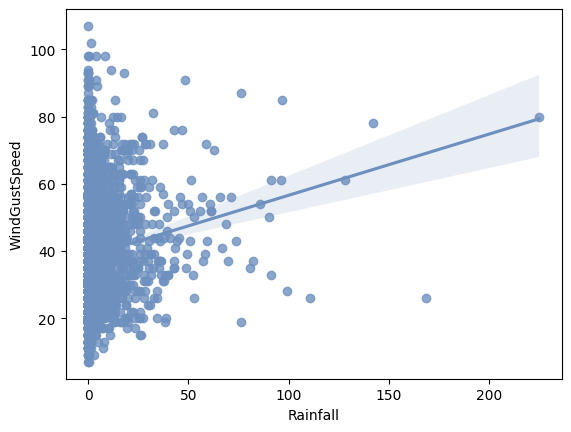

In [57]:
# WindGustSpeed vs Rainfall
sns.regplot(x='Rainfall', y='WindGustSpeed', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be positive correlation between Rainfall and WindGustSpeed, indicating increase in WindGustSpeed results in increase in rain.

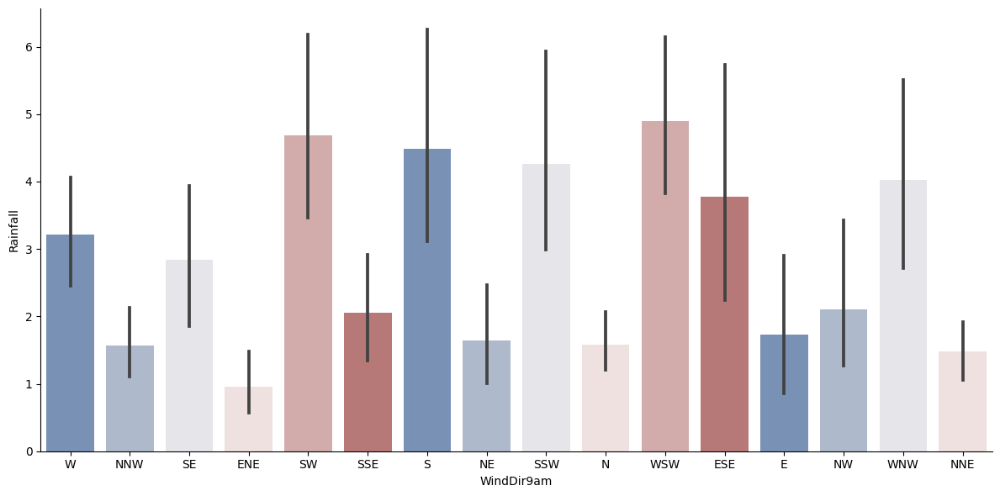

In [58]:
# WindDir9am vs Rainfall
sns.catplot(x='WindDir9am', y='Rainfall', data=df, height=6, aspect=12/6, kind='bar', palette=sns.color_palette('vlag'))
plt.show()

Rainfall seems to be higher on average when Wind direction at 9am is WSW (West South West).

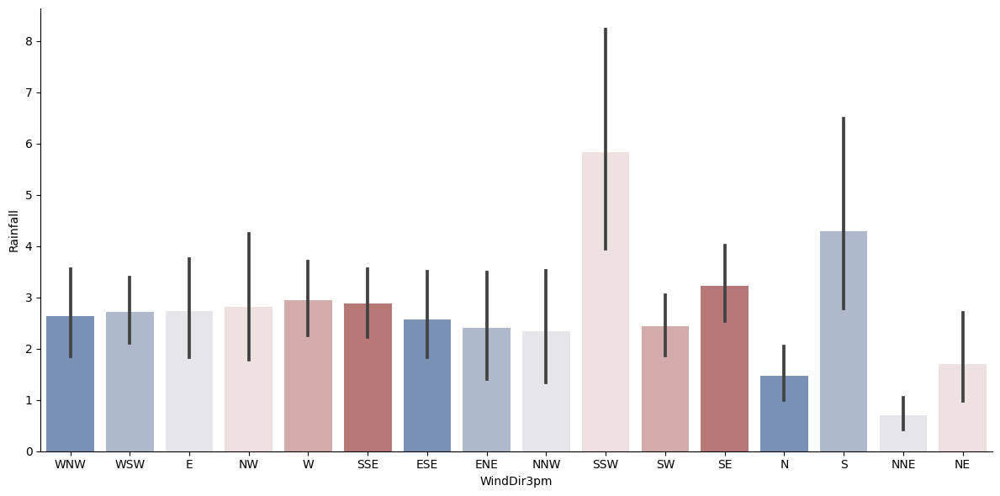

In [59]:
# WindDir3pm vs Rainfall
sns.catplot(x='WindDir3pm', y='Rainfall', data=df, height=6, aspect=12/6, kind='bar', palette=sns.color_palette('vlag'))
plt.show()

Rainfall seems to be higher on average when Wind direction at 3pm is SSW (South South West).

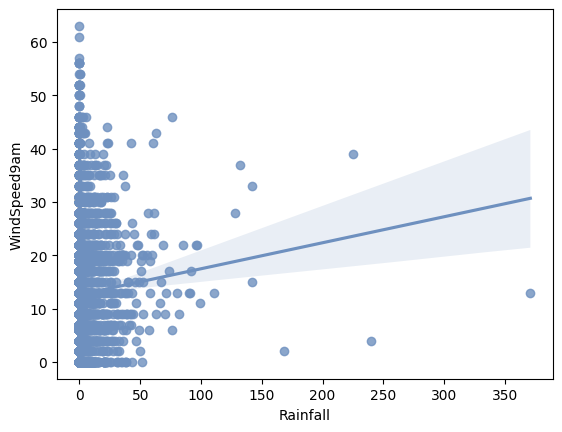

In [60]:
# WindSpeed9am vs Rainfall
sns.regplot(x='Rainfall', y='WindSpeed9am', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be slight positive correlation between Rainfall and WindSpeed9am, indicating increase in WindSpeed9am results in slight increase in rain.

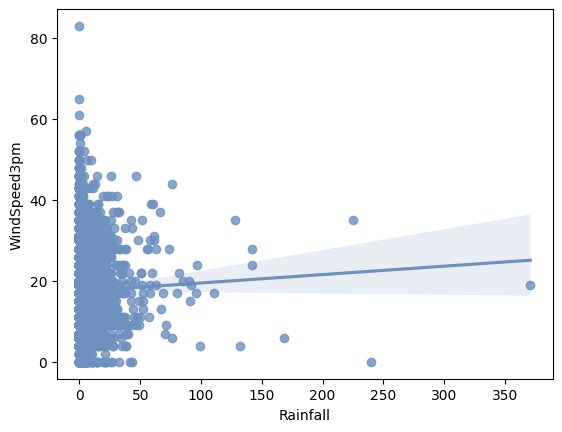

In [61]:
# WindSpeed3pm vs Rainfall
sns.regplot(x='Rainfall', y='WindSpeed3pm', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be almost no correlation between Rainfall and WindSpeed3pm.

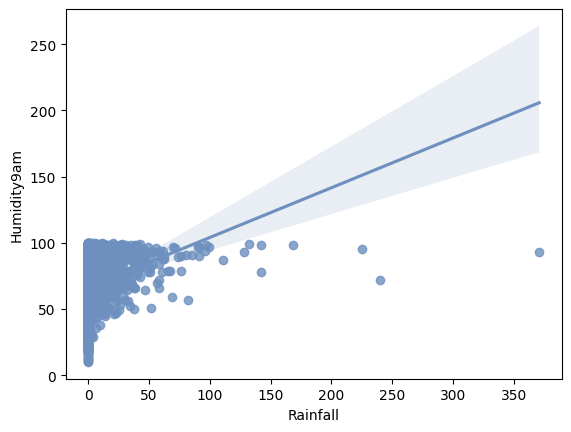

In [62]:
# Humidity9am vs Rainfall
sns.regplot(x='Rainfall', y='Humidity9am', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be positive correlation between Rainfall and Humidity9am, indicating increase in Humidity9am results in higher rainfall.

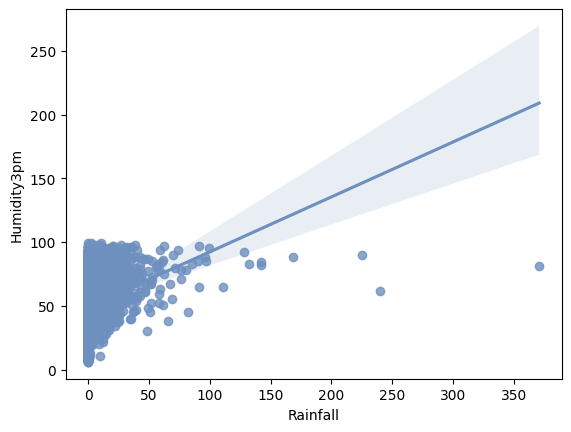

In [63]:
# Humidity3pm vs Rainfall
sns.regplot(x='Rainfall', y='Humidity3pm', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be positive correlation between Rainfall and Humidity3pm, indicating increase in Humidity3pm also results in increase in rain.

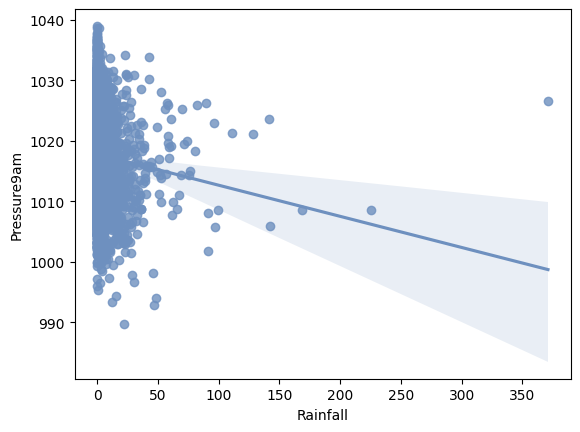

In [64]:
# Pressure9am vs Rainfall
sns.regplot(x='Rainfall', y='Pressure9am', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be negative correlation between Rainfall and Pressure9am, indicating decrease in Pressure9am results in increase in rain and vice versa.

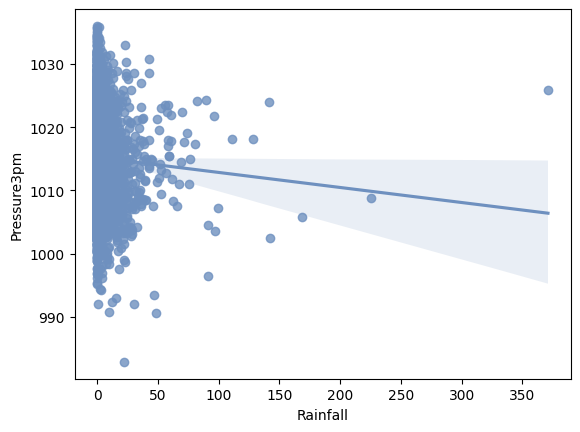

In [65]:
# Pressure3pm vs Rainfall
sns.regplot(x='Rainfall', y='Pressure3pm', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

Again, there seems to be negative correlation between Rainfall and Pressure3pm, so decrease in Pressure3pm results in increase in rain.

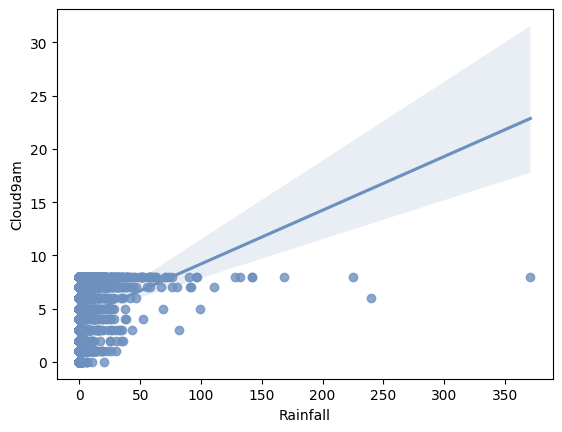

In [66]:
# Cloud9am vs Rainfall
sns.regplot(x='Rainfall', y='Cloud9am', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be positive correlation between Rainfall and Cloud9am. So more cloud cover results in higher rainfall.

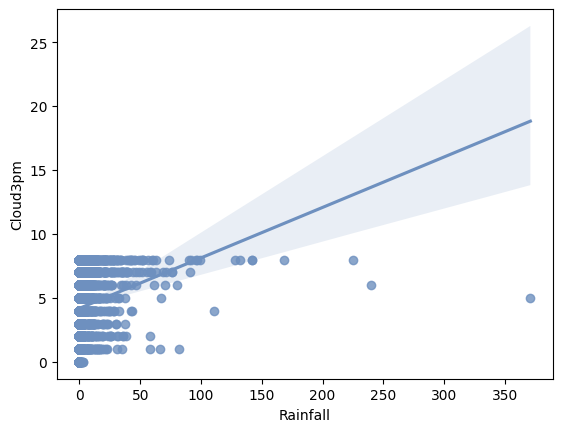

In [67]:
# Cloud3pm vs Rainfall
sns.regplot(x='Rainfall', y='Cloud3pm', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be positive correlation between Rainfall and Cloud3pm, indicating more cloud cover at 3pm results in higher rainfall.

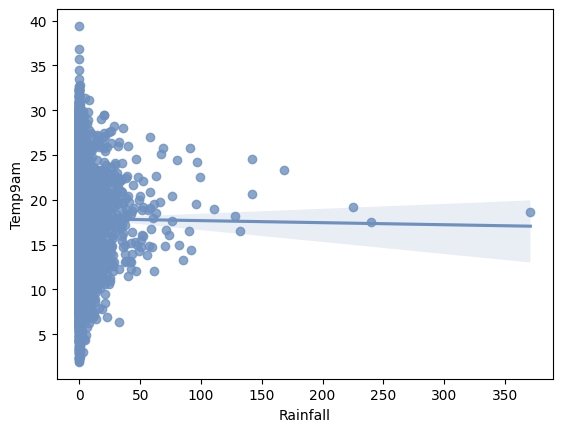

In [68]:
# Temp9am vs Rainfall
sns.regplot(x='Rainfall', y='Temp9am', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be almost no relationship between Rainfall and Temp9am.

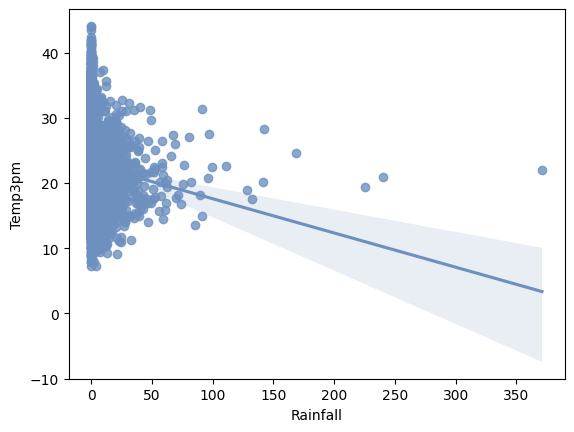

In [69]:
# Temp3pm vs Rainfall
sns.regplot(x='Rainfall', y='Temp3pm', data=df)
plt.yticks(rotation = 0, fontsize = 10)
plt.show()

There seems to be negative correlation between Rainfall and Temp3pm, indicating increase in Temp3pm results in lower rainfall.

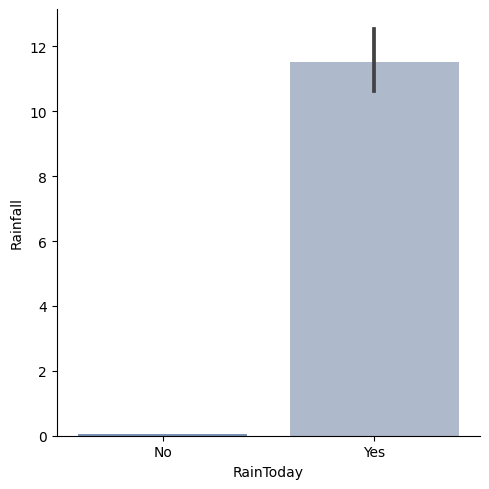

In [70]:
# RainToday vs Rainfall
sns.catplot(x='RainToday', y='Rainfall', data=df, kind='bar', palette=sns.color_palette('vlag'))
plt.show()

Rainfall seems to be higher on average when there is rain that day, which is expected. The average rainfall is close to 12 mm.

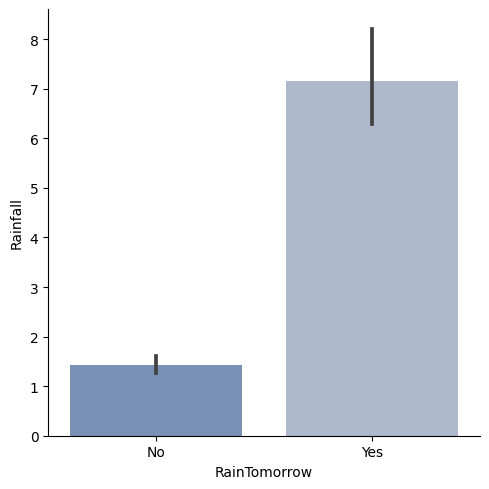

In [71]:
# RainTomorrow vs Rainfall
sns.catplot(x='RainTomorrow', y='Rainfall', data=df, kind='bar', palette=sns.color_palette('vlag'))
plt.show()

Rainfall seems to be higher on average when there is rain the next day. The average next day rainfall is around 7mm.

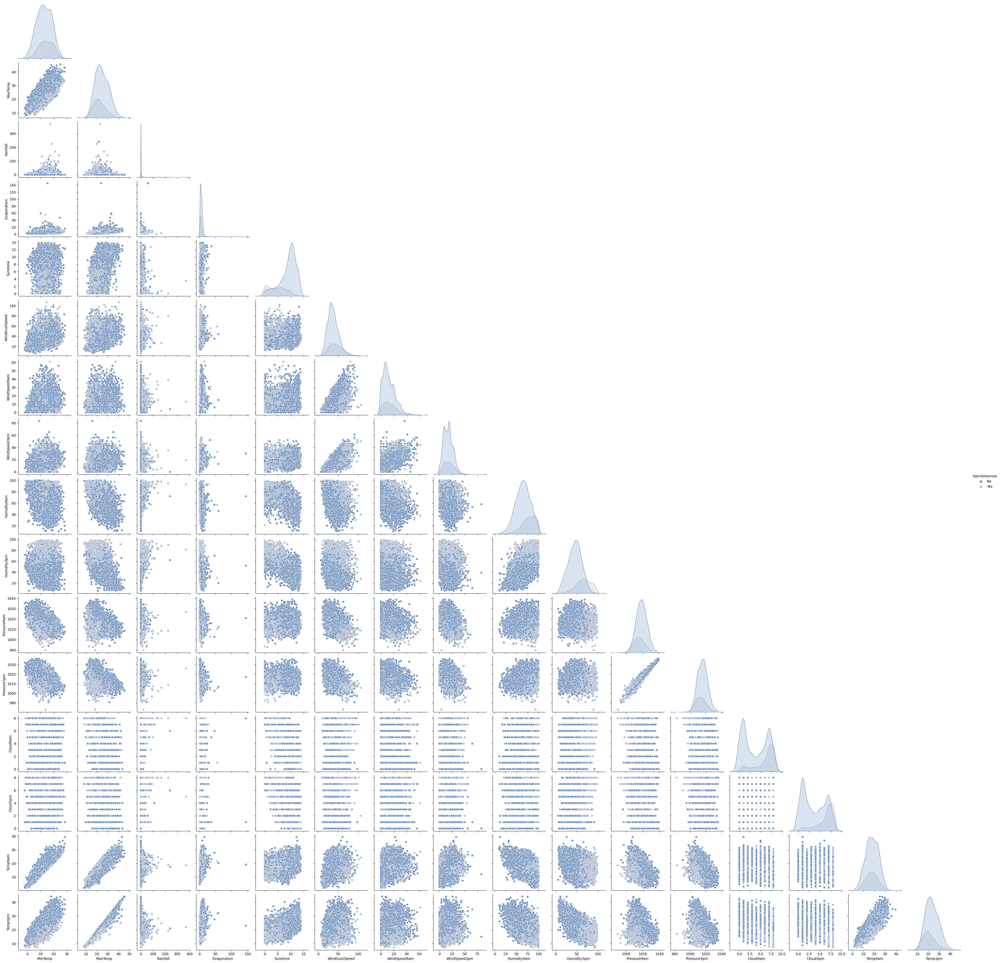

In [72]:
# Pairwise relation between variables with respect to the Survived
sns.pairplot(df, hue='RainTomorrow', corner=True)
plt.show()

The observations from the pairplot are:
- There seem to be strong positive correlation between MinTemp and MaxTemp, MinTemp and Temp9am, MinTemp and Temp3pm, MaxTemp and Temp9am, MaxTemp and Temp3pm, Temp9am and Temp3pm, Pressure9am and Pressure3pm.
- There seem to be moderate correlation between WindGustSpeed, WindSpeed9am and WindSpeed3pm.
- Rest of the relationships are not very strong.

##### Multivariate analysis

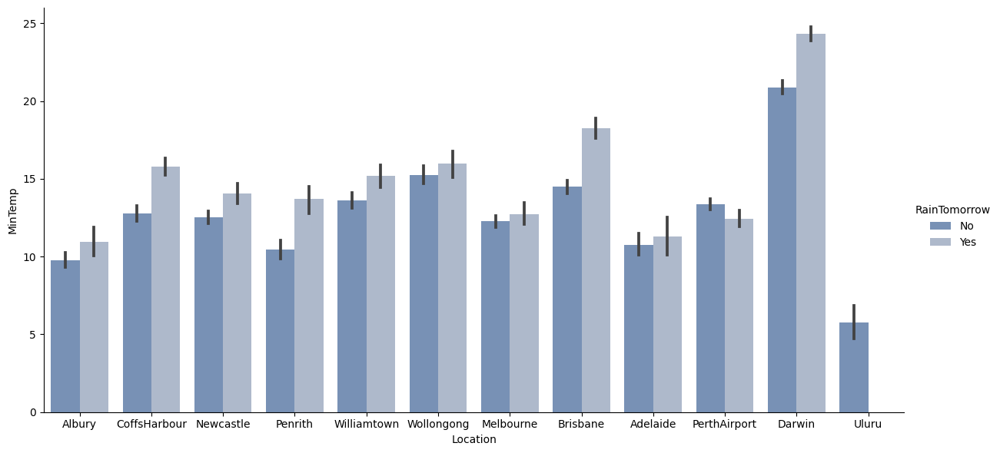

In [73]:
# Comparison between MinTemp, Location and RainTomorrow
sns.catplot(x='Location', y='MinTemp', hue='RainTomorrow', data=df, height=6, aspect=12/6, kind='bar')
plt.show()

The minimum temperature tends to be higher when there is rain the next day. On average, the min temperature is generally highest for Darwin when there is rain the next day.

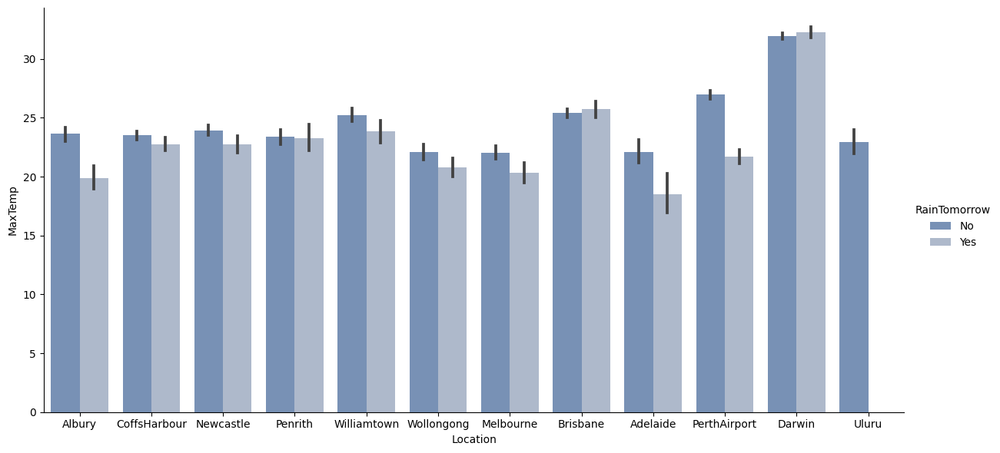

In [74]:
# Comparison between MaxTemp, Location and RainTomorrow
sns.catplot(x='Location', y='MaxTemp', hue='RainTomorrow', data=df, height=6, aspect=12/6, kind='bar')
plt.show()

The maximum temperature tends to be lower when there is rain the next day. On average, the max temperature is generally lowest for Adelaide when there is rain the next day.

##### Time Series Analysis

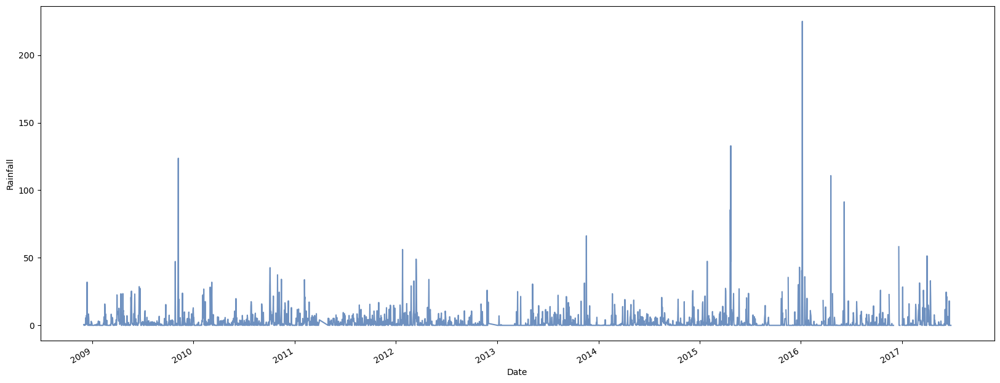

In [75]:
date_df = df.groupby(['Date']).mean()
plt.figure(figsize=(20,8))
date_df['Rainfall'].plot()
plt.ylabel('Rainfall')
plt.show()

### Data preprocessing

In [76]:
df.isna().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

We need to remove na values from the target columns instead of imputing the values.

#### Removing rows

In [77]:
# Removing rows where station and date has missing values
df.dropna(subset=['Rainfall', 'RainTomorrow'], inplace=True)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


In [78]:
df.isna().sum()

Date                0
Location            0
MinTemp            47
MaxTemp            34
Rainfall            0
Evaporation      2829
Sunshine         3133
WindGustDir       902
WindGustSpeed     902
WindDir9am        767
WindDir3pm        273
WindSpeed9am       41
WindSpeed3pm       80
Humidity9am        35
Humidity3pm        77
Pressure9am      1284
Pressure3pm      1285
Cloud9am         1739
Cloud3pm         1780
Temp9am            32
Temp3pm            73
RainToday           0
RainTomorrow        0
dtype: int64

Now, we will proceed with data imputation for remaining columns with missing values.

#### Imputation

For variables with mean value close to the median, we can perform mean imputation. For variables with hige difference between mean and median (greater skewness), we will perform median imputaton.<br>
Based on the dataset description during EDA, we can decide whether to perform mean or median imputation.<br>
For categorical variables we will perform imputation with the most frequently occurring value.

##### Mean imputation

In [79]:
# Filling missing values using mean imputation 
cols = ["MinTemp", "MaxTemp", "WindSpeed3pm", "Humidity9am", "Humidity3pm", "Pressure9am",
        "Pressure3pm", "Cloud9am", "Cloud3pm", "Temp9am", "Temp3pm"]

for col in cols:
    df[col] = df[col].fillna(df[col].mean())

##### Median imputation

In [80]:
# Filling missing values using median imputation 
cols= ["Evaporation", "Sunshine", "WindGustSpeed", "WindSpeed9am"]

for col in cols:
    df[col] = df[col].fillna(df[col].median())

##### Mode imputation

In [81]:
# Filling missing values using mode imputation 
cols= ["WindGustDir", "WindDir9am", "WindDir3pm"]

for col in cols:
    df[col] = df[col].fillna(df[col].mode()[0])

In [82]:
df.isna().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

There are no missing values in the dataset now.

#### Feature engineering

The temperaturevalues are highly correlated to each other. So are the pressure and humidity values. So taking an average of these values would resolve any multicollinearity issues.

In [83]:
# Taking average of Temperature, Pressure, Humidity, Wind Speed, Cloud values (to avoid multicollinearity)
df['AvgTemp'] = df.apply(lambda x: (x.MinTemp + x.MaxTemp + x.Temp9am + x.Temp3pm)/4, axis=1)
df['AvgPressure'] = df.apply(lambda x: (x.Pressure9am + x.Pressure3pm)/2, axis=1)
df['AvgHumidity'] = df.apply(lambda x: (x.Humidity9am + x.Humidity3pm)/2, axis=1)
df['AvgWindSpeed'] = df.apply(lambda x: (x.WindSpeed9am + x.WindSpeed3pm)/2, axis=1)
df['AvgCloud'] = df.apply(lambda x: (x.Cloud9am + x.Cloud3pm)/2, axis=1)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,AvgTemp,AvgPressure,AvgHumidity,AvgWindSpeed,AvgCloud
0,2008-12-01,Albury,13.4,22.9,0.6,4.6,9.0,W,44.0,W,...,4.301172,16.9,21.8,No,No,18.750,1007.40,46.5,22.0,6.150586
1,2008-12-02,Albury,7.4,25.1,0.0,4.6,9.0,WNW,44.0,NNW,...,4.301172,17.2,24.3,No,No,18.500,1009.20,34.5,13.0,4.302692
2,2008-12-03,Albury,12.9,25.7,0.0,4.6,9.0,WSW,46.0,W,...,2.000000,21.0,23.2,No,No,20.700,1008.15,34.0,22.5,3.152106
3,2008-12-04,Albury,9.2,28.0,0.0,4.6,9.0,NE,24.0,SE,...,4.301172,18.1,26.5,No,No,20.450,1015.20,30.5,10.0,4.302692
4,2008-12-05,Albury,17.5,32.3,1.0,4.6,9.0,W,41.0,ENE,...,8.000000,17.8,29.7,No,No,24.325,1008.40,57.5,13.5,7.500000


In [84]:
# Dropping the extra columns
df.drop(columns=['MinTemp', 'MaxTemp', 'Temp9am', 'Temp3pm', 'Pressure9am', 'Pressure3pm','Humidity9am',
                 'Humidity3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Cloud3pm'], inplace=True)
df.head()

,Date,Location,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,AvgTemp,AvgPressure,AvgHumidity,AvgWindSpeed,AvgCloud
0,2008-12-01,Albury,0.6,4.6,9.0,W,44.0,W,WNW,No,No,18.750,1007.40,46.5,22.0,6.150586
1,2008-12-02,Albury,0.0,4.6,9.0,WNW,44.0,NNW,WSW,No,No,18.500,1009.20,34.5,13.0,4.302692
2,2008-12-03,Albury,0.0,4.6,9.0,WSW,46.0,W,WSW,No,No,20.700,1008.15,34.0,22.5,3.152106
3,2008-12-04,Albury,0.0,4.6,9.0,NE,24.0,SE,E,No,No,20.450,1015.20,30.5,10.0,4.302692
4,2008-12-05,Albury,1.0,4.6,9.0,W,41.0,ENE,NW,No,No,24.325,1008.40,57.5,13.5,7.500000


In [85]:
# Checking the dimension of the dataset
df.shape

(6558, 16)

There are 6558 rows and 16 columns now in the dataset.

In [86]:
# New numeric columns
num_cols = df.drop(columns=['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow'])
num_cols.columns.to_list()

['Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'AvgTemp',
 'AvgPressure',
 'AvgHumidity',
 'AvgWindSpeed',
 'AvgCloud']

##### Data distribution

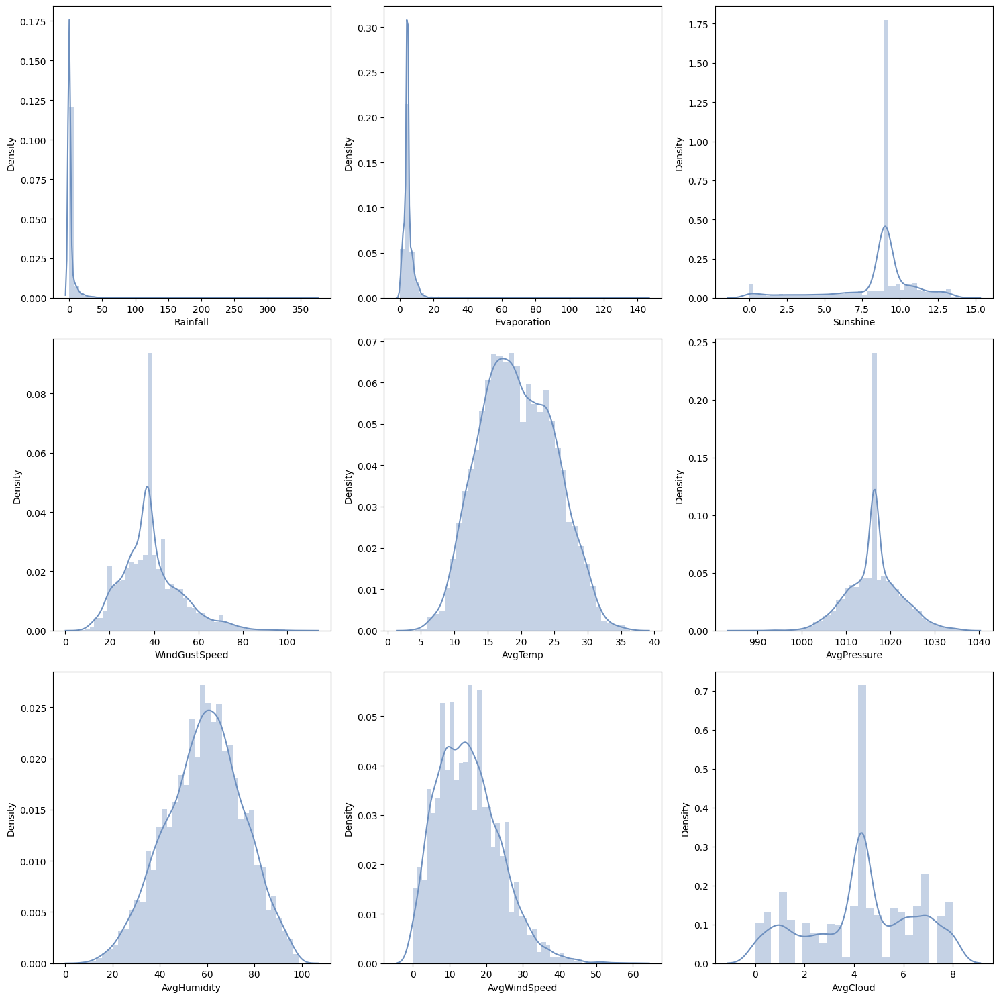

In [87]:
# Data distribution
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 9:
        ax = plt.subplot(3, 3, plot_num)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

The distribution with the new features seems almost normal.

### Checking for outliers

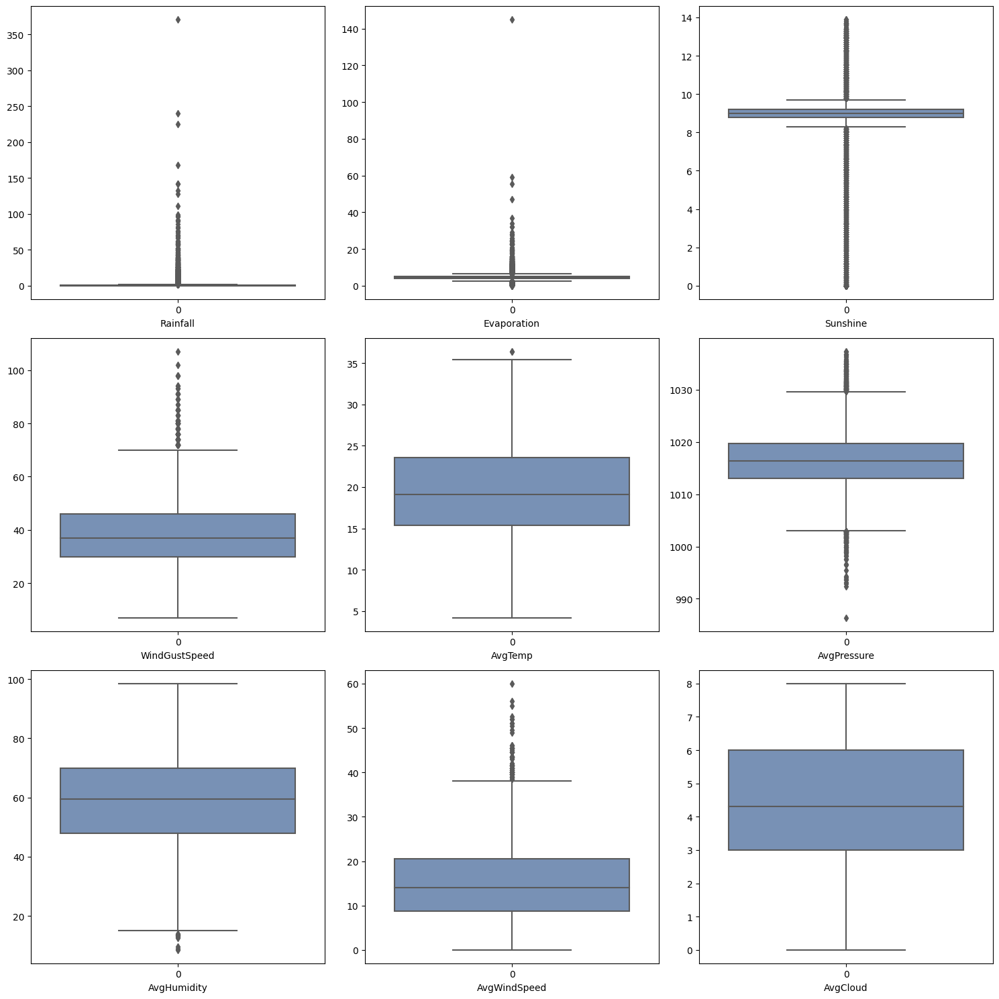

In [88]:
# Checking for outliers using boxplot
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 9:
        ax = plt.subplot(3, 3, plot_num)
        sns.boxplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

The columns with several outliers are: Rainfall, Evaporation, Sunshine, WindGustSpeed, AvgPressure, and AvgWindSpeed. Since, we are predicting Rainfall we will not remove outliers from these columns.<br>
The outliers can be removed using Z-score method or IQR method depending on data loss percentage with both the methods.

In [89]:
# Dropping the date colum before proceeding as it has no significance in the model.
df.drop(columns='Date', inplace=True)

Since Date is an ordinal variable, we cannot consider it for outlier removal

#### Z-score method

In [90]:
from scipy.stats import zscore

In [91]:
out_features = df[['Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'AvgPressure', 'AvgWindSpeed']]
z = np.abs(zscore(out_features))
z

,Rainfall,Evaporation,Sunshine,WindGustSpeed,AvgPressure,AvgWindSpeed
0,0.204852,0.122224,0.198196,0.406435,1.521611,0.811462
1,0.261463,0.122224,0.198196,0.406435,1.218144,0.244855
2,0.261463,0.122224,0.198196,0.556084,1.395166,0.870146
3,0.261463,0.122224,0.198196,1.090056,0.206588,0.596961
4,0.167111,0.122224,0.198196,0.181961,1.353018,0.186171
...,...,...,...,...,...,...
8419,0.261463,0.122224,0.198196,0.566284,1.100006,0.127486
8420,0.261463,0.122224,0.198196,0.566284,1.015709,0.362224
8421,0.261463,0.122224,0.198196,1.239705,0.821828,0.479592
8422,0.261463,0.122224,0.198196,0.117337,0.417205,0.714329


In [92]:
# Removing data where z-score is above 3 (threshold value) for normal distribution
df_z = df[(z<3).all(axis=1)]
df_z.shape

(6174, 15)

In [93]:
# Data loss percentage
old = df.shape[0]
new_z = df_z.shape[0]

(old - new_z)/old * 100

5.85544373284538

Data loss percentage is around 5.85% for Z-score method.

#### IQR method

In [94]:
q1 = out_features.quantile(0.25)
q3 = out_features.quantile(0.75)

iqr = q3 - q1

df_q = df[~((df < (q1 - 1.5*iqr))| (df > (q3 + 1.5*iqr))).any(axis=1)]

df_q.shape

(2479, 15)

In [95]:
# Data loss percentage
old = df.shape[0]
new_q = df_q.shape[0]

(old - new_q)/old * 100

62.19884111009454

Data loss percentage is around 62.2%, which is very very high. Normally, we consider data loss of less than 10% only.<br>

So, we will use the z-score method to remove outliers.

In [96]:
df = df_z

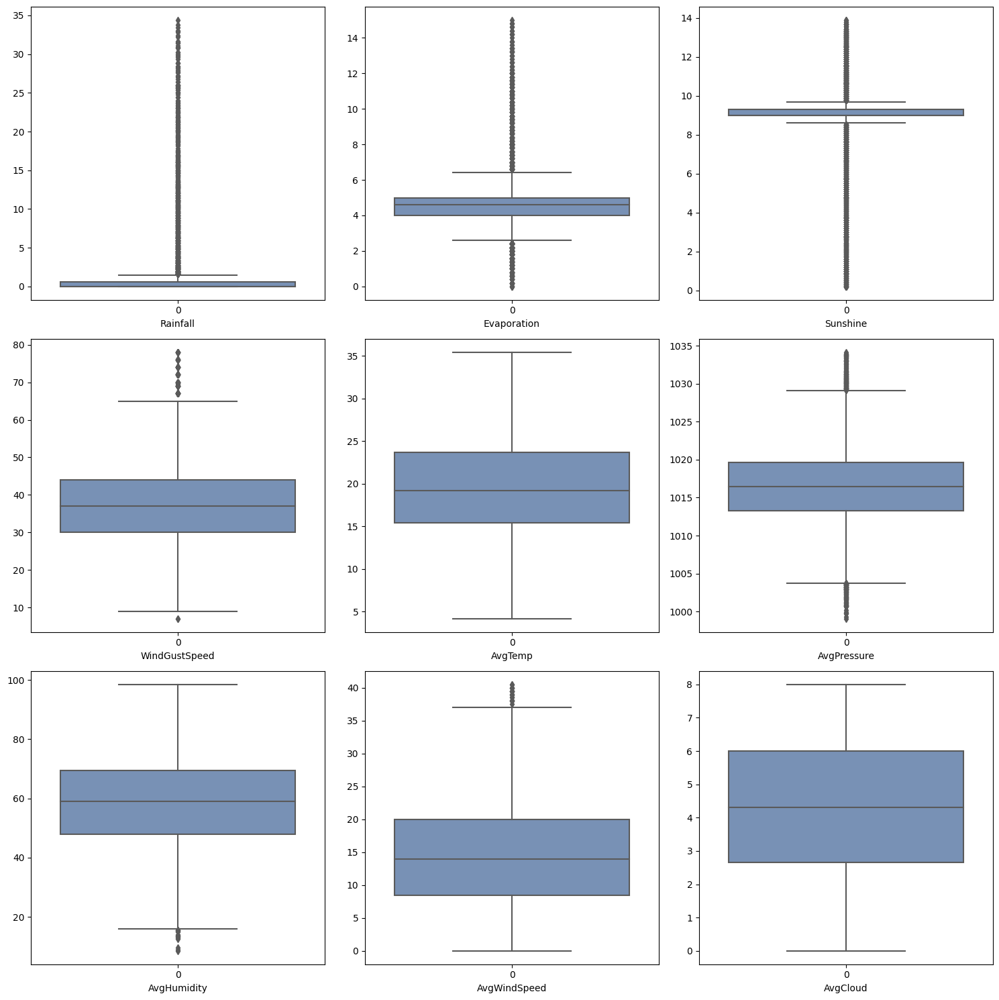

In [97]:
# Checking for outliers again using boxplot
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 9:
        ax = plt.subplot(3, 3, plot_num)
        sns.boxplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There are fewer outliers in the dataset now. We should check and remove skewness.

After outlier removal, the data distribution looks like this.

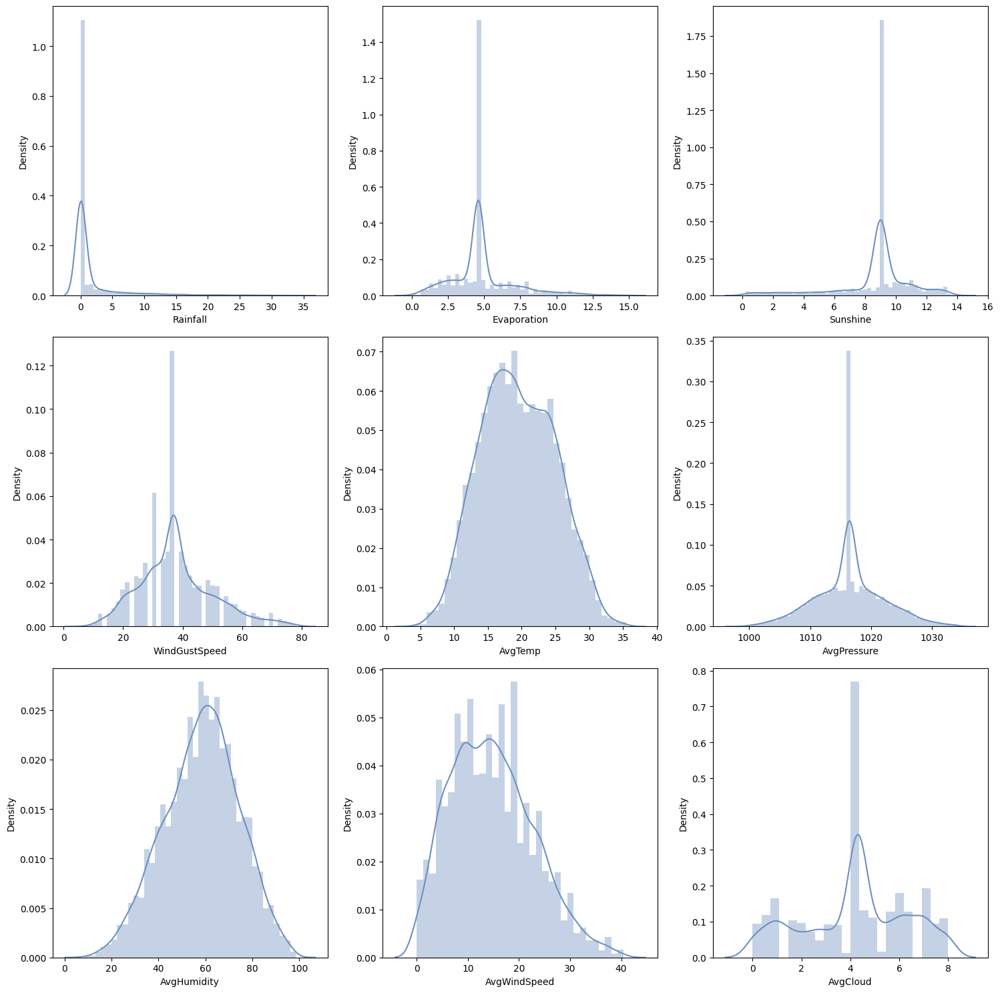

In [98]:
# Data distribution after outlier removal
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 9:
        ax = plt.subplot(3, 3, plot_num)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

Now, we can remove the skewness to normalise the distribution.

### Checking for skewness

In [99]:
df.skew()

Rainfall         3.567515
Evaporation      1.170720
Sunshine        -1.333251
WindGustSpeed    0.564003
AvgTemp          0.097546
AvgPressure      0.092944
AvgHumidity     -0.176573
AvgWindSpeed     0.431153
AvgCloud        -0.215967
dtype: float64

The acceptable skewness range is between -0.5 to 0.5 (for extremely normal distributions)<br>
This means that Rainfall, Evaporation, Sunshine, and WindGustSpeed are all skewed.

In [100]:
#Importing extra libraries to remove skewness
from scipy import stats
from scipy import special

In [101]:
# Removing skewness
columns = ['Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed']

skew_transform = {}

for col in columns:
    transformed_log = np.log(df[col])                        # Log Transformation
    transformed_boxcox = special.boxcox1p(df[col], 0.15)     # Box-Cox Transformation with lambda=0.15
    transformed_inverse = 1 / df[col]                        # Inverse Transformation
    transformed_yeojohnson, _ = stats.yeojohnson(df[col])    # Yeo-Johnson Transformation
    transformed_cbrt = np.cbrt(df[col])                      # Cube Root Transformation
    transformed_sqrt = np.sqrt(df[col])                      # Square Root Transformation

    # Creating a dictionary for the skewness values of each transformation
    transformed_skew = {
        "Log Transformation": stats.skew(transformed_log),
        "Box-Cox Transformation": stats.skew(transformed_boxcox),
        "Inverse Transformation": stats.skew(transformed_inverse),
        "Yeo Johnson Transformation": stats.skew(transformed_yeojohnson),
        "Cube Root Transformation": stats.skew(transformed_cbrt),
        "Square Root Transformation": stats.skew(transformed_sqrt)}

    # Storing the transformation skewness values for the column
    skew_transform[col] = transformed_skew

In [102]:
skew_transform_df = pd.DataFrame.from_dict(skew_transform)
skew_transform_df

,Rainfall,Evaporation,Sunshine,WindGustSpeed
Log Transformation,NaN,NaN,-3.650717,-0.548936
Box-Cox Transformation,2.024973,-0.336782,-2.572443,-0.329482
Inverse Transformation,NaN,NaN,9.390142,2.173993
Yeo Johnson Transformation,1.073832,0.056600,-0.062511,0.008179
Cube Root Transformation,1.512463,-0.528934,-2.637879,-0.146419
Square Root Transformation,2.058067,0.021541,-2.251658,0.041114


The Yeo Johnson transformation is the most suitable one for bringing the values in acceptable range of -0.5 to 0.5. For Rainfall, the skewness is slightly above 1, which means it is moderately normal even after transformation

In [103]:
# Transforming using YeoJohnson
for col in columns:
    transformed_col, _ = stats.yeojohnson(df[col])
    df[col] = transformed_col

In [104]:
df.head()

,Location,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,AvgTemp,AvgPressure,AvgHumidity,AvgWindSpeed,AvgCloud
0,Albury,0.316587,2.380974,52.899238,W,10.190799,W,WNW,No,No,18.750,1007.40,46.5,22.0,6.150586
1,Albury,-0.000000,2.380974,52.899238,WNW,10.190799,NNW,WSW,No,No,18.500,1009.20,34.5,13.0,4.302692
2,Albury,-0.000000,2.380974,52.899238,WSW,10.437742,W,WSW,No,No,20.700,1008.15,34.0,22.5,3.152106
3,Albury,-0.000000,2.380974,52.899238,NE,7.289649,SE,E,No,No,20.450,1015.20,30.5,10.0,4.302692
4,Albury,0.395049,2.380974,52.899238,W,9.808862,ENE,NW,No,No,24.325,1008.40,57.5,13.5,7.500000


These are the transformed values.

In [105]:
df.skew()

Rainfall         1.074093
Evaporation      0.056614
Sunshine        -0.062526
WindGustSpeed    0.008181
AvgTemp          0.097546
AvgPressure      0.092944
AvgHumidity     -0.176573
AvgWindSpeed     0.431153
AvgCloud        -0.215967
dtype: float64

Now the skewness values are within the range of -0.5 to 0.5, except LDAPS_PPT. LDAPS_PPT has a skewness of 1.037 which is moderately normal.

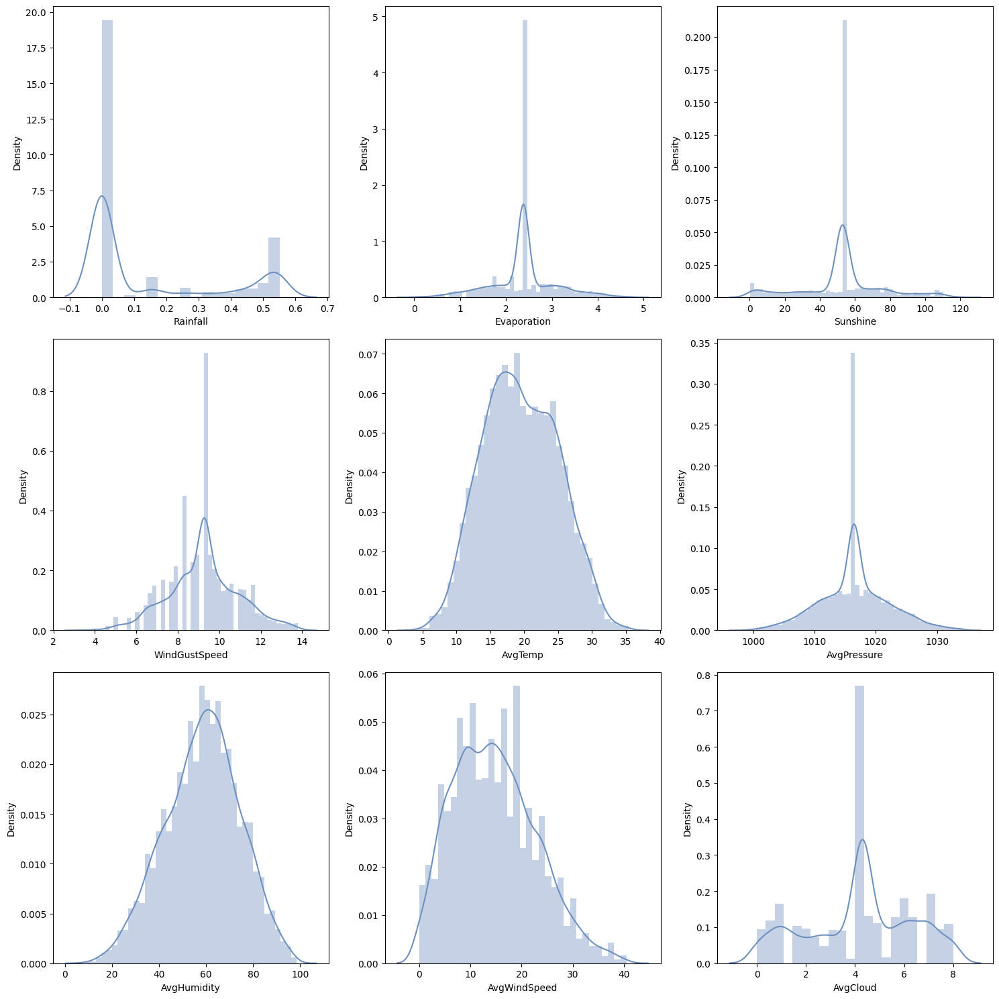

In [106]:
# Data distribution after data transformation
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 9:
        ax = plt.subplot(3, 3, plot_num)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

As we can observe, the data is more normalised now.

### Encoding categorical variables

In [107]:
# Using LabelEncoder
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

In [108]:
for i in df.columns:
    if df[i].dtype == 'object':
        df[i] = le.fit_transform(df[i].values.reshape(-1, 1))

In [109]:
df.head()

,Location,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,AvgTemp,AvgPressure,AvgHumidity,AvgWindSpeed,AvgCloud
0,1,0.316587,2.380974,52.899238,13,10.190799,13,14,0,0,18.750,1007.40,46.5,22.0,6.150586
1,1,-0.000000,2.380974,52.899238,14,10.190799,6,15,0,0,18.500,1009.20,34.5,13.0,4.302692
2,1,-0.000000,2.380974,52.899238,15,10.437742,13,15,0,0,20.700,1008.15,34.0,22.5,3.152106
3,1,-0.000000,2.380974,52.899238,4,7.289649,9,0,0,0,20.450,1015.20,30.5,10.0,4.302692
4,1,0.395049,2.380974,52.899238,13,9.808862,1,7,0,0,24.325,1008.40,57.5,13.5,7.500000


The categorical variables have been encoded now. RainTomorrow value No = 0 and Yes = 1.

### Correlation analysis

In [110]:
df.corr()

,Location,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,AvgTemp,AvgPressure,AvgHumidity,AvgWindSpeed,AvgCloud
Location,1.000000,0.009965,0.114387,0.064749,-0.088934,0.274582,-0.106686,0.006580,0.003473,0.008516,0.085514,-0.013586,-0.011687,0.264840,-0.004315
Rainfall,0.009965,1.000000,-0.219649,-0.265339,0.119762,0.073964,0.155834,0.120532,0.929846,0.329647,-0.159467,-0.068367,0.455706,0.010615,0.331436
Evaporation,0.114387,-0.219649,1.000000,0.468169,-0.119373,0.221983,-0.116772,-0.023794,-0.191881,-0.106183,0.479104,-0.295986,-0.342508,0.189704,-0.159723
Sunshine,0.064749,-0.265339,0.468169,1.000000,-0.117952,0.053010,-0.111866,-0.054436,-0.230764,-0.303388,0.288207,-0.078769,-0.423819,0.059173,-0.586828
WindGustDir,-0.088934,0.119762,-0.119373,-0.117952,1.000000,0.011486,0.376124,0.455004,0.117307,0.038673,-0.189299,-0.057131,0.014864,0.128378,0.106367
WindGustSpeed,0.274582,0.073964,0.221983,0.053010,0.011486,1.000000,-0.067636,0.099428,0.083083,0.162804,0.236514,-0.346581,-0.225891,0.684972,0.020491
WindDir9am,-0.106686,0.155834,-0.116772,-0.111866,0.376124,-0.067636,1.000000,0.200854,0.154416,0.036598,-0.132162,0.011272,0.074419,0.072895,0.070742
WindDir3pm,0.006580,0.120532,-0.023794,-0.054436,0.455004,0.099428,0.200854,1.000000,0.102142,0.006277,-0.161686,-0.099679,-0.008600,0.069606,0.077300
RainToday,0.003473,0.929846,-0.191881,-0.230764,0.117307,0.083083,0.154416,0.102142,1.000000,0.300339,-0.137260,-0.067487,0.397459,0.031271,0.289206
RainTomorrow,0.008516,0.329647,-0.106183,-0.303388,0.038673,0.162804,0.036598,0.006277,0.300339,1.000000,-0.084053,-0.130574,0.410352,0.038833,0.349108


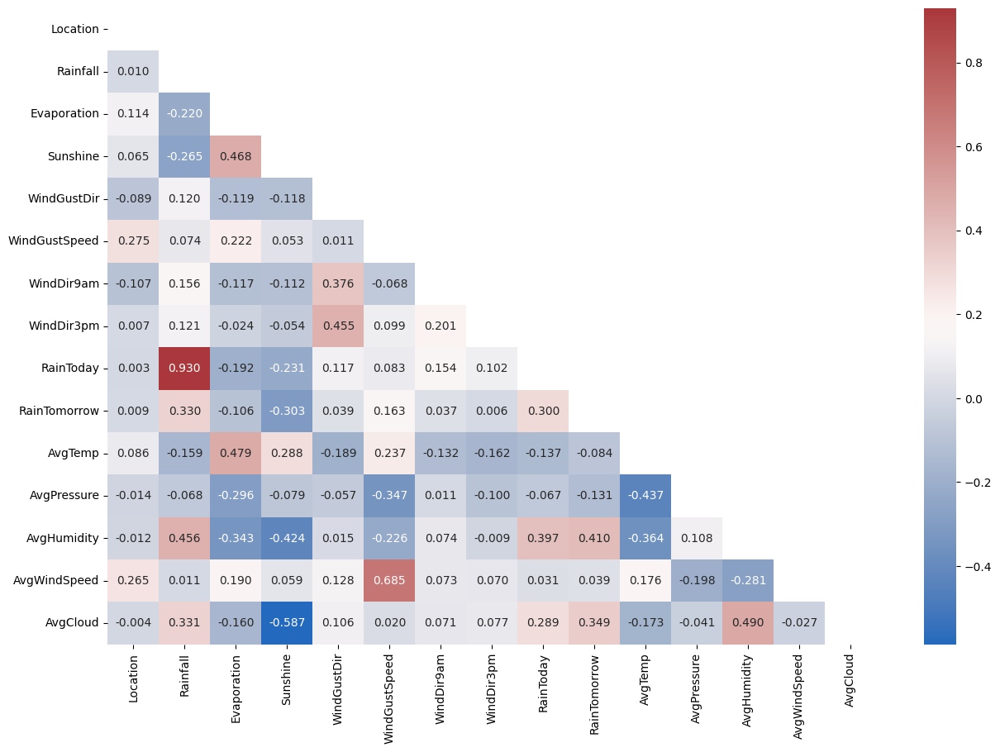

In [111]:
# Heatmap for correlation analysis
mask = np.zeros_like(df.corr())
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(15, 10))
sns.heatmap(df.corr(), annot=True, fmt='.3f', cmap='vlag', mask=mask)
plt.show()

Observations from the correlation heatmap:
- There seems to be very strong correlation between Rainfall and RainToday.
- Wind Gust Speed and AvgWindSpeed also have a moderately strong linear relationship.
- There are a few other moderate relationships observed in the data.
The strong relationships will be handled during VIF evaluation for multicollinearity issues.

#### Correlation of other variables with RainTomorrow

In [112]:
df.corr()['RainTomorrow'].sort_values(ascending=False)

RainTomorrow     1.000000
AvgHumidity      0.410352
AvgCloud         0.349108
Rainfall         0.329647
RainToday        0.300339
WindGustSpeed    0.162804
AvgWindSpeed     0.038833
WindGustDir      0.038673
WindDir9am       0.036598
Location         0.008516
WindDir3pm       0.006277
AvgTemp         -0.084053
Evaporation     -0.106183
AvgPressure     -0.130574
Sunshine        -0.303388
Name: RainTomorrow, dtype: float64

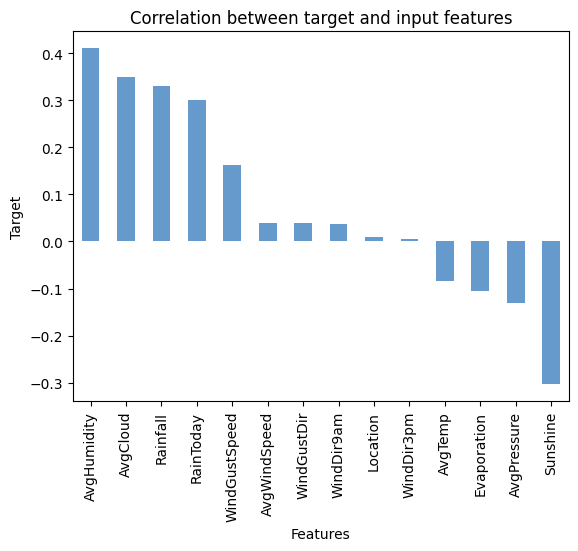

In [113]:
# Visualising the correlation between target (RainTomorrow) and input features
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar', color='#6699CC')
plt.title('Correlation between target and input features')
plt.xlabel('Features')
plt.ylabel('Target')
plt.show()

Avg Humidity, AvgCloud, Rainfall and Sunshine have the maximum correlation with RainTomorrow.

#### Correlation of other variables with Rainfall

In [114]:
df.corr()['Rainfall'].sort_values(ascending=False)

Rainfall         1.000000
RainToday        0.929846
AvgHumidity      0.455706
AvgCloud         0.331436
RainTomorrow     0.329647
WindDir9am       0.155834
WindDir3pm       0.120532
WindGustDir      0.119762
WindGustSpeed    0.073964
AvgWindSpeed     0.010615
Location         0.009965
AvgPressure     -0.068367
AvgTemp         -0.159467
Evaporation     -0.219649
Sunshine        -0.265339
Name: Rainfall, dtype: float64

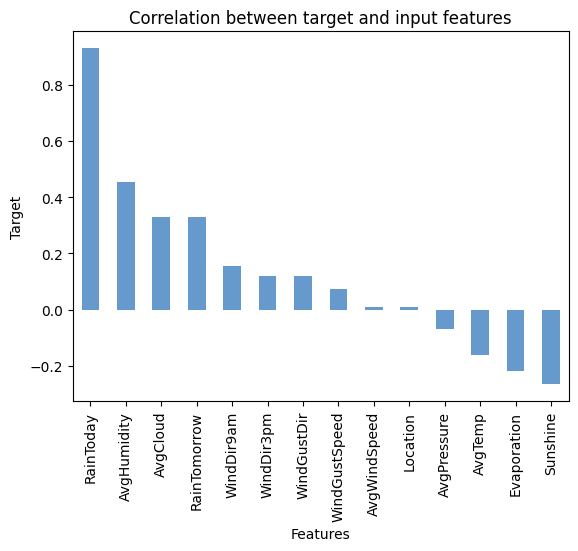

In [115]:
# Visualising the correlation between target (Rainfall) and input features
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar', color='#6699CC')
plt.title('Correlation between target and input features')
plt.xlabel('Features')
plt.ylabel('Target')
plt.show()

Rainfall has maximum correlation with RainToday which is expected. The next best relationship is with Avg Humidity.

## Part 1: Predicting RainTomorrow

### Separating features and target

In [116]:
x = df.drop(columns=['RainTomorrow'])
y = df['RainTomorrow']

#### Feature scaling

In [117]:
# Importing StandardScaler
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,Location,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,AvgTemp,AvgPressure,AvgHumidity,AvgWindSpeed,AvgCloud
0,-1.385612,0.822081,-0.002343,0.006311,1.226778,0.558063,1.330182,1.371489,-0.531015,-0.131828,-1.612542,-0.751204,0.903084,0.914423
1,-1.385612,-0.644618,-0.002343,0.006311,1.417476,0.558063,-0.214359,1.594631,-0.531015,-0.177436,-1.294206,-1.508091,-0.213511,0.045231
2,-1.385612,-0.644618,-0.002343,0.006311,1.608174,0.705163,1.330182,1.594631,-0.531015,0.223917,-1.479902,-1.539628,0.965117,-0.495970
3,-1.385612,-0.644618,-0.002343,0.006311,-0.489501,-1.170109,0.447587,-1.752500,-0.531015,0.178309,-0.233084,-1.760387,-0.585709,0.045231
4,-1.385612,1.185587,-0.002343,0.006311,1.226778,0.330549,-1.317602,-0.190506,-0.531015,0.885238,-1.435689,-0.057390,-0.151478,1.549146


### Checking Variance Inflation Factor

In [118]:
# Checking for multicollinearity using Variance Inflation factor
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_values = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif = pd.DataFrame({'Features': x.columns, 'VIF': vif_values})
vif

,Features,VIF
0,Location,1.146890
1,Rainfall,8.068909
2,Evaporation,1.694764
3,Sunshine,1.975631
4,WindGustDir,1.496170
5,WindGustSpeed,2.241992
6,WindDir9am,1.223919
7,WindDir3pm,1.339491
8,RainToday,7.473795
9,AvgTemp,1.713301


There is no multicollinearity in the dataset as VIF values are less than 10 (indicates moderate collinearity)

### Model Building

In [119]:
# Importing required libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

#### Splitting data into train and test

In [120]:
# Finding the best random state for splitting the data into training and validation sets.
max_accu = 0
max_rs = 0
for i in range(1, 200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, 
                                                        test_size=0.3,
                                                        random_state=i,
                                                        stratify=y
                                                       )
    # The split should be stratified so that y samples for both classes are equally represented in training and test data
    lr = LogisticRegression()
    lr.fit(x_train, y_train)
    y_pred = lr.predict(x_test)
    accu = accuracy_score(y_test, y_pred)
    if accu > max_accu:
        max_accu = accu
        max_rs = i
        
print(f'Best accuracy: {max_accu}\nRandom state for best accuracy: {max_rs}')

Best accuracy: 0.8548300053966541
Random state for best accuracy: 179


In [121]:
# Splitting into train-test data using best random state
x_train, x_test, y_train, y_test = train_test_split(x, y, 
                                                    test_size=0.3,
                                                    random_state=max_rs,
                                                    stratify=y
                                                   )

#### Checking for class imbalance

In [122]:
y_train.value_counts()

0    3391
1     930
Name: RainTomorrow, dtype: int64

There seems to be a huge class imbalance which needs to be handled.

#### Oversampling using SMOTE

In [123]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42) # choosing random state for reproducible results
x1, y1 = sm.fit_resample(x_train, y_train)

In [124]:
y1.value_counts()

0    3391
1    3391
Name: RainTomorrow, dtype: int64

The imbalance has now been resolved by oversampling.

#### Classification Models

In [125]:
# Importing several Classification models
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
import catboost
import xgboost

# Importing model evaluation metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [126]:
models = [
    ('Logistic Regression', LogisticRegression()),
    ('Support Vector Classifier', SVC()),
    ('KNN', KNeighborsClassifier()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('Gaussian Naive Bayes', GaussianNB()),
    ('Extra Trees', ExtraTreesClassifier()),
    ('AdaBoost', AdaBoostClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier()),
    ('XGBoost', xgboost.XGBClassifier()),
    ('CatBoost', catboost.CatBoostClassifier(verbose=0))
]

accuracies = []
confusion_matrices = []
classification_reports = []

for model_name, model in models:
    
    model.fit(x1, y1)
    y_pred = model.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    cr = classification_report(y_test, y_pred)
    
    accuracies.append((model_name, accuracy))
    confusion_matrices.append((model_name, cm))
    classification_reports.append((model_name, cr))

df_results = pd.DataFrame(accuracies, columns=['Model', 'Accuracy'])
df_results.sort_values('Accuracy', ascending=False, inplace=True)

df_results

,Model,Accuracy
10,CatBoost,0.840799
9,XGBoost,0.836481
4,Random Forest,0.828386
6,Extra Trees,0.825688
8,Gradient Boosting,0.806800
7,AdaBoost,0.784674
1,Support Vector Classifier,0.782515
0,Logistic Regression,0.773341
3,Decision Tree,0.751754
5,Gaussian Naive Bayes,0.750675


We can observe that CatBoost model performs the best with 84.08% accuracy.

#### Confusion matrices

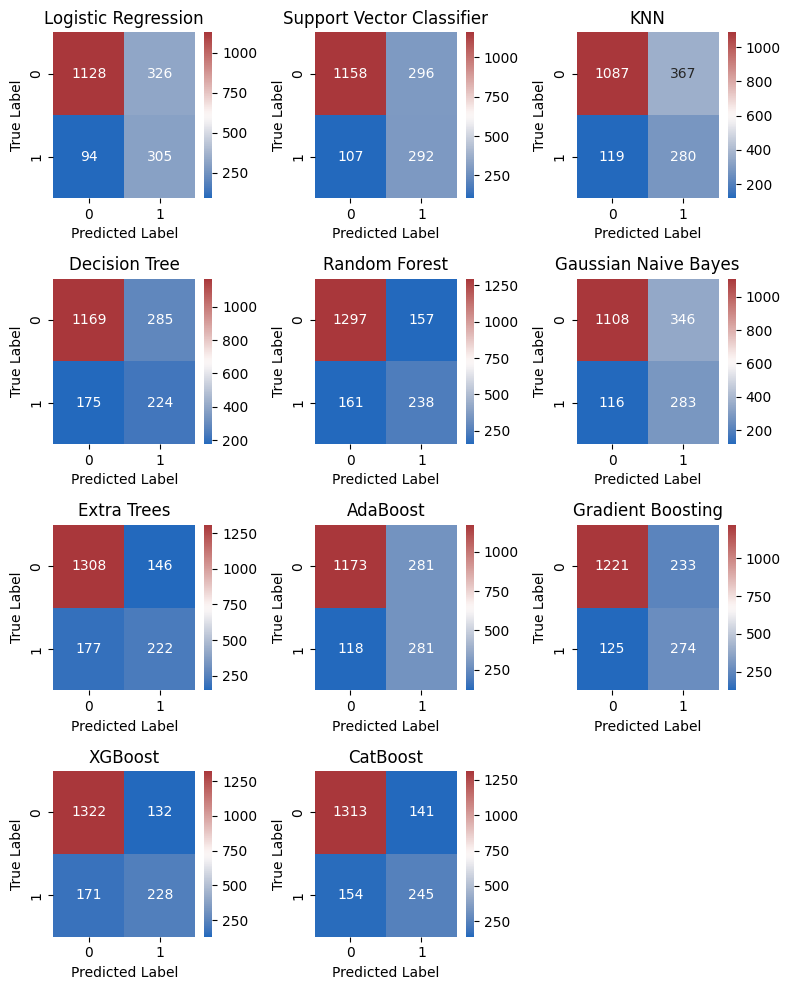

In [127]:
plt.figure(figsize=(8, 10))
for i, (model_name, cm) in enumerate(confusion_matrices, 1):
    plt.subplot(4, 3, i)
    plt.title(model_name)
    sns.heatmap(cm, annot=True, fmt='d', cmap='vlag')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
plt.tight_layout()
plt.show()

#### Classification reports

In [128]:
for model_name, cr in classification_reports:
    print(model_name)
    print(cr)
    print('-'*60)

Logistic Regression
              precision    recall  f1-score   support

           0       0.92      0.78      0.84      1454
           1       0.48      0.76      0.59       399

    accuracy                           0.77      1853
   macro avg       0.70      0.77      0.72      1853
weighted avg       0.83      0.77      0.79      1853

------------------------------------------------------------
Support Vector Classifier
              precision    recall  f1-score   support

           0       0.92      0.80      0.85      1454
           1       0.50      0.73      0.59       399

    accuracy                           0.78      1853
   macro avg       0.71      0.76      0.72      1853
weighted avg       0.83      0.78      0.80      1853

------------------------------------------------------------
KNN
              precision    recall  f1-score   support

           0       0.90      0.75      0.82      1454
           1       0.43      0.70      0.54       399

    accura

For CatBoost model, both precision and recall values are also high along with the accuracy.

#### Using Cross Validation

In [129]:
from sklearn.model_selection import cross_val_score

In [130]:
accuracies = []

for model_name, model in models:
    cv_score = cross_val_score(model, x1, y1, cv=5) # Using fold value of 5
    mean_accuracy = cv_score.mean()
    
    model.fit(x1, y1)
    y_pred = model.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    cr = classification_report(y_test, y_pred)
    
    diff = abs(accuracy - mean_accuracy)
    
    accuracies.append((model_name, mean_accuracy, accuracy, diff))

df_results = pd.DataFrame(accuracies, columns=['Model', 'CV Accuracy', 'Accuracy', 'Difference'])
df_results.sort_values('Difference', ascending=True, inplace=True)

df_results

,Model,CV Accuracy,Accuracy,Difference
0,Logistic Regression,0.763784,0.773341,0.009556
7,AdaBoost,0.799918,0.784674,0.015245
5,Gaussian Naive Bayes,0.729283,0.750675,0.021392
8,Gradient Boosting,0.838112,0.806800,0.031312
10,CatBoost,0.880292,0.840799,0.039493
1,Support Vector Classifier,0.825422,0.782515,0.042907
9,XGBoost,0.881031,0.836481,0.044549
4,Random Forest,0.897677,0.839719,0.057957
3,Decision Tree,0.817615,0.746357,0.071257
6,Extra Trees,0.917284,0.825688,0.091596


The least overfitting model is the Logistic Regression model. The differences between Test accuracy and Validation accuracy is less than 10% for all models. So we need to tune hyperparameters of all the models to determine the best performing model.

#### Hyperparameter Tuning

In [131]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc, RocCurveDisplay

##### Logistic Regression

In [132]:
params = {
    'penalty': ['l1', 'l2', 'elasticnet', None],
    'solver': ['lbfgs','newton-cg','liblinear','sag','saga', 'newton-cholesky'],
    'fit_intercept': [True, False],
    'max_iter': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
    }

In [133]:
gcv = GridSearchCV(LogisticRegression(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'fit_intercept': [True, False],
                         'max_iter': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'penalty': ['l1', 'l2', 'elasticnet', None],
                         'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag',
                                    'saga', 'newton-cholesky']},
             scoring='accuracy')

In [134]:
best_params = gcv.best_params_
best_params

{'fit_intercept': True, 'max_iter': 8, 'penalty': 'l2', 'solver': 'saga'}

In [135]:
model_lr = LogisticRegression(**best_params)
model_lr.fit(x1, y1)
y_pred_lr = model_lr.predict(x_test)
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(accuracy_lr)

0.7733405288720993


The accuracy is around 77.39%

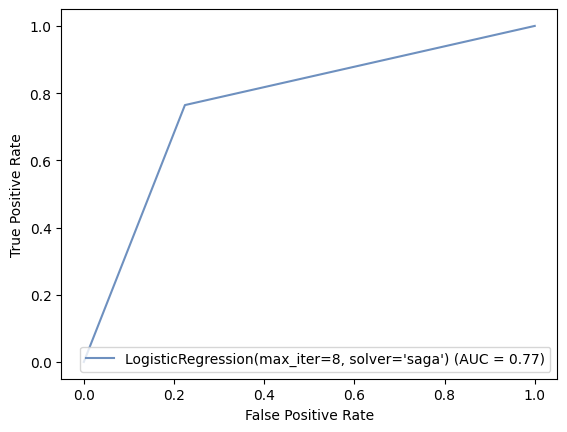

In [136]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_lr)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_lr)
display.plot()
plt.show()

The AUC value is 0.77

##### Support Vector Classifier

In [137]:
params = {
    'kernel': ['rbf', 'poly', 'linear', 'sigmoid', 'precomputedd'],
    'gamma': ['scale', 'auto'],
    'max_iter': [-1, 1, 2, 5, 7]
    }

In [138]:
gcv = GridSearchCV(SVC(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly', 'linear', 'sigmoid',
                                    'precomputedd'],
                         'max_iter': [-1, 1, 2, 5, 7]},
             scoring='accuracy')

In [139]:
best_params = gcv.best_params_
best_params

{'gamma': 'auto', 'kernel': 'rbf', 'max_iter': -1}

In [140]:
model_sv = SVC(**best_params)
model_sv.fit(x1, y1)
y_pred_sv = model_sv.predict(x_test)
accuracy_sv = accuracy_score(y_test, y_pred_sv)
print(accuracy_sv)

0.7819751753912574


The accuracy is 78.19%

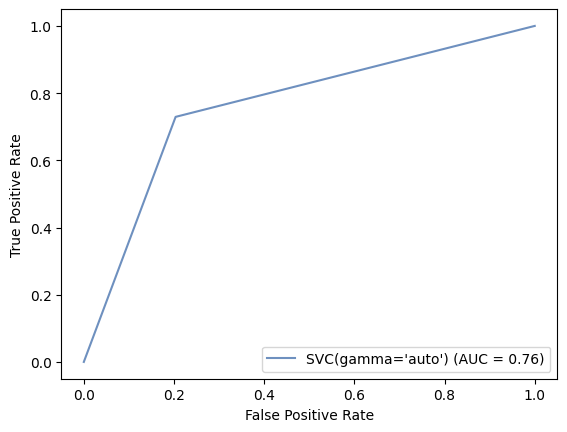

In [141]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_sv)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_sv)
display.plot()
plt.show()

The AUC value is 0.76

##### KNN

In [142]:
params = {
    'n_neighbors': [2, 3, 5, 7, 9, 11],
    'weights': ['uniform','distance'],
    'metric': ['minkowski','euclidean','manhattan'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
    }

In [143]:
gcv = GridSearchCV(KNeighborsClassifier(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': [2, 3, 5, 7, 9, 11],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [144]:
best_params = gcv.best_params_
best_params

{'algorithm': 'auto',
 'metric': 'manhattan',
 'n_neighbors': 2,
 'weights': 'distance'}

In [145]:
model_knn = KNeighborsClassifier(**best_params)
model_knn.fit(x1, y1)
y_pred_knn = model_knn.predict(x_test)
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(accuracy_knn)

0.7949271451699946


The accuracy is around 79.49%

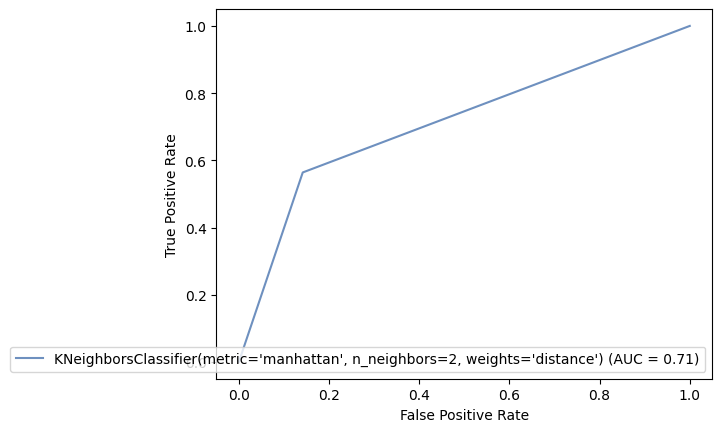

In [146]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_knn)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_knn)
display.plot()
plt.show()

The AUC is 0.71

##### Decision Tree

In [147]:
params = {
    'max_depth': [None, 1, 2, 3, 5, 10, 20, 25, 30, 50],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6],
    'min_samples_split': [1, 2, 3, 4, 5, 6],
    'criterion': ["gini", "entropy", "log_loss"]
    }

In [148]:
gcv = GridSearchCV(DecisionTreeClassifier(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [None, 1, 2, 3, 5, 10, 20, 25, 30, 50],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6],
                         'min_samples_split': [1, 2, 3, 4, 5, 6]},
             scoring='accuracy')

In [149]:
best_params = gcv.best_params_
best_params

{'criterion': 'entropy',
 'max_depth': 50,
 'min_samples_leaf': 1,
 'min_samples_split': 1}

In [150]:
model_dt = DecisionTreeClassifier(**best_params)
model_dt.fit(x1, y1)
y_pred_dt = model_dt.predict(x_test)
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(accuracy_dt)

0.7647058823529411


The accuracy of the model is 76.64%

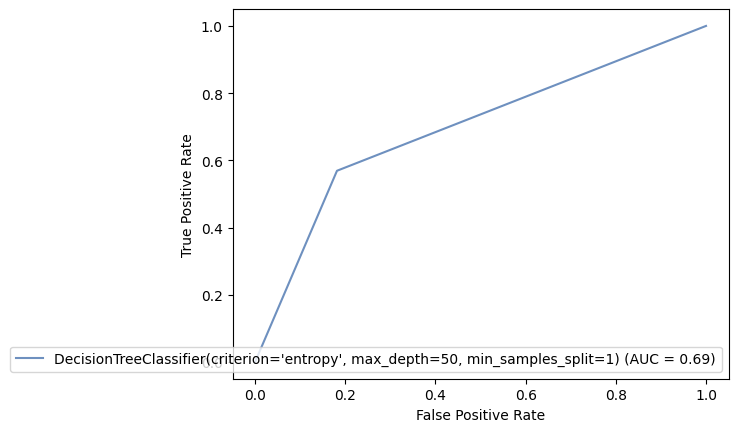

In [151]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_dt)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_dt)
display.plot()
plt.show()

The AUC value is 0.68

##### Random Forest

In [152]:
params = {
    'max_depth': [None, 10, 100, 200],
    'min_samples_leaf': [1, 2, 4],
    'min_samples_split': [1, 2, 5, 10],
    'bootstrap': [True, False],
    'n_estimators': [25, 50, 70, 100],
    'criterion': ["gini", "entropy", "log_loss"],
    'max_features': ['log2', 'sqrt', None]
    }

In [153]:
gcv = GridSearchCV(RandomForestClassifier(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True, False],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [None, 10, 100, 200],
                         'max_features': ['log2', 'sqrt', None],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [1, 2, 5, 10],
                         'n_estimators': [25, 50, 70, 100]},
             scoring='accuracy')

In [154]:
best_params = gcv.best_params_
best_params

{'bootstrap': False,
 'criterion': 'log_loss',
 'max_depth': None,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 1,
 'n_estimators': 100}

In [155]:
model_rf = RandomForestClassifier(**best_params)
model_rf.fit(x1, y1)
y_pred_rf = model_rf.predict(x_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(accuracy_rf)

0.8381003777657852


The accuracy is 83.81%

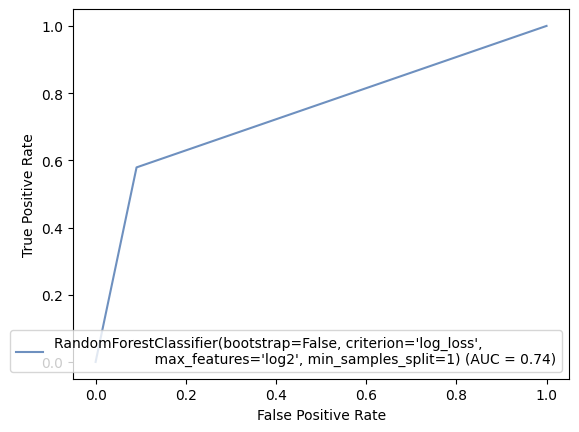

In [156]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_rf)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_rf)
display.plot()
plt.show()

The AUC value is 0.74

##### Gaussian Naive Bayes

In [157]:
params = {
    'priors': [None],
    'var_smoothing': [0.00000001, 0.000000001, 0.0000000001]
}

In [158]:
gcv = GridSearchCV(GaussianNB(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'priors': [None],
                         'var_smoothing': [1e-08, 1e-09, 1e-10]},
             scoring='accuracy')

In [159]:
best_params = gcv.best_params_
best_params

{'priors': None, 'var_smoothing': 1e-08}

In [160]:
model_gnb = GaussianNB(**best_params)
model_gnb.fit(x1, y1)
y_pred_gnb = model_gnb.predict(x_test)
accuracy_gnb = accuracy_score(y_test, y_pred_gnb)
print(accuracy_gnb)

0.7506745817593092


The accuracy is 75.07%

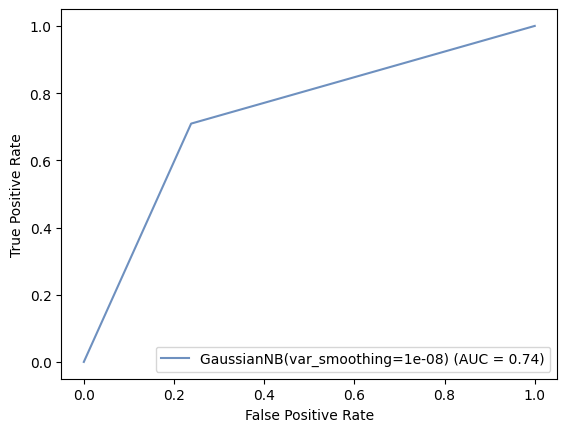

In [161]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_gnb)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_gnb)
display.plot()
plt.show()

The AUC value is 0.74

##### Extra Trees

In [162]:
params = {
    'max_depth': [None, 10, 100, 200],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ["gini", "entropy", "log_loss"],
    'n_estimators': [50, 100, 200],
    }

In [163]:
gcv = GridSearchCV(ExtraTreesClassifier(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [None, 10, 100, 200],
                         'min_samples_leaf': [1, 2, 4],
                         'n_estimators': [50, 100, 200]},
             scoring='accuracy')

In [164]:
best_params = gcv.best_params_
best_params

{'criterion': 'gini',
 'max_depth': None,
 'min_samples_leaf': 1,
 'n_estimators': 100}

In [165]:
model_et = ExtraTreesClassifier(**best_params)
model_et.fit(x1, y1)
y_pred_et = model_et.predict(x_test)
accuracy_et = accuracy_score(y_test, y_pred_et)
print(accuracy_et)

0.832164058283864


The accuracy is 83.22%

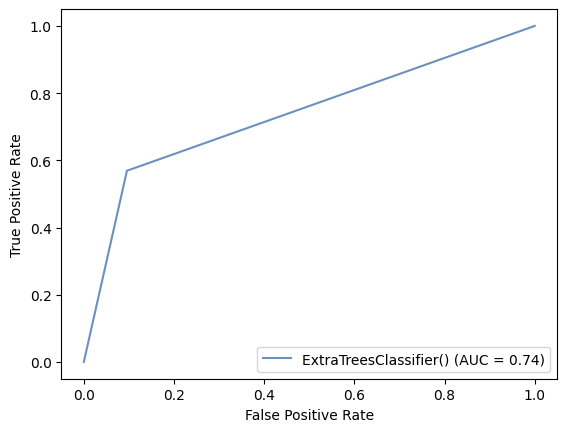

In [166]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_et)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_et)
display.plot()
plt.show()

The AUC value is 0.74

##### AdaBoost

In [167]:
params = {
    'random_state': [None, 0, 5, 10, 15, 20, 25],
    'n_estimators': [100, 500, 700, 1000],
    'learning_rate':[0.001, 0.01, 0.1, 1.0]
}

In [168]:
gcv = GridSearchCV(AdaBoostClassifier(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5, estimator=AdaBoostClassifier(),
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1.0],
                         'n_estimators': [100, 500, 700, 1000],
                         'random_state': [None, 0, 5, 10, 15, 20, 25]},
             scoring='accuracy')

In [169]:
best_params = gcv.best_params_
best_params

{'learning_rate': 1.0, 'n_estimators': 1000, 'random_state': None}

In [170]:
model_ad = AdaBoostClassifier(**best_params)
model_ad.fit(x1, y1)
y_pred_ad = model_ad.predict(x_test)
accuracy_ad = accuracy_score(y_test, y_pred_ad)
print(accuracy_ad)

0.8283864004317323


The accuracy is 82.84%

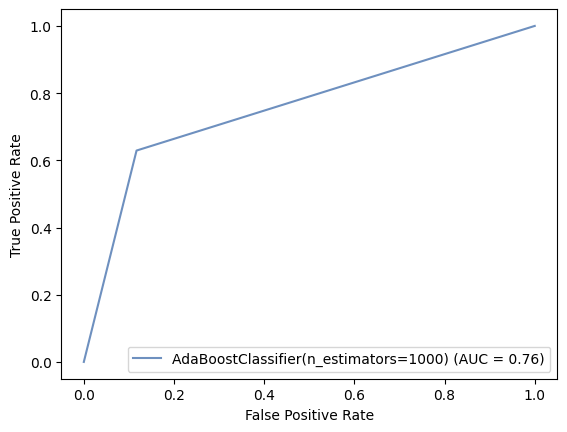

In [171]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_ad)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_ad)
display.plot()
plt.show()

The AUC is 0.76

##### Gradient Boosting

In [172]:
params = {
    "n_estimators":[100, 200, 500],
    "max_depth":[None, 1, 3, 5, 7, 9, 10],
    "learning_rate":[0.01, 0.1, 1.0],
    "loss": ['log_loss', 'exponential'],
    "criterion": ['friedman_mse', 'squared_error']
    }

In [173]:
gcv = GridSearchCV(GradientBoostingClassifier(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'learning_rate': [0.01, 0.1, 1.0],
                         'loss': ['log_loss', 'exponential'],
                         'max_depth': [None, 1, 3, 5, 7, 9, 10],
                         'n_estimators': [100, 200, 500]},
             scoring='accuracy')

In [174]:
best_params = gcv.best_params_
best_params

{'criterion': 'squared_error',
 'learning_rate': 0.1,
 'loss': 'exponential',
 'max_depth': 10,
 'n_estimators': 500}

In [175]:
model_gb = GradientBoostingClassifier(**best_params)
model_gb.fit(x1, y1)
y_pred_gb = model_gb.predict(x_test)
accuracy_gb = accuracy_score(y_test, y_pred_gb)
print(accuracy_gb)

0.8451160280626012


The accuracy is around 84.56%

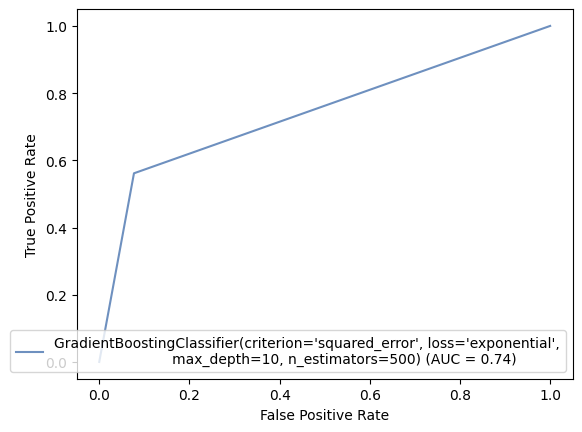

In [176]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_gb)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_gb)
display.plot()
plt.show()

The AUC value is 0.74

##### XGBoost

In [177]:
params = {
    'max_depth': [1, 2, 3, 5, 6, 7, 10],
    'learning_rate': [0.001, 0.01, 0.1, 1.0],
    'subsample': [0.2, 0.5, 0.7, 1],
    'n_estimators': [10, 50, 100, 200]
    }

In [178]:
gcv = GridSearchCV(xgboost.XGBClassifier(), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1.0],
                         'max_depth': [1, 2, 3, 5, 6, 7, 10],
                         'n_estimators': [10, 50, 100, 200],
                         'subsample': [0.2, 0.5, 0.7, 1]},
             scoring='accuracy')

In [179]:
best_params = gcv.best_params_
best_params

{'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 200, 'subsample': 0.5}

In [180]:
model_xg = xgboost.XGBClassifier(**best_params)
model_xg.fit(x1, y1)
y_pred_xg = model_xg.predict(x_test)
accuracy_xg = accuracy_score(y_test, y_pred_xg)
print(accuracy_xg)

0.8381003777657852


The accuracy of the model is 83.81%

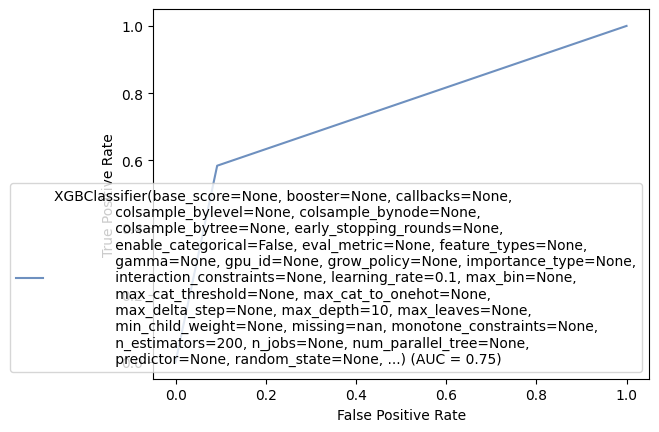

In [181]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_xg)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_xg)
display.plot()
plt.show()

The AUC value of the model is 0.75

##### CatBoost

In [182]:
params = {
    'depth': [4, 5, 6, 7, 8, 9, 10],
    'learning_rate': [0.001, 0.01, 0.1, 1],
    'iterations': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
    }

In [183]:
gcv = GridSearchCV(catboost.CatBoostClassifier(verbose=0), params, cv=5, scoring='accuracy')
gcv.fit(x1, y1)

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x00000173B6D3FEB0>,
             param_grid={'depth': [4, 5, 6, 7, 8, 9, 10],
                         'iterations': [10, 20, 30, 40, 50, 60, 70, 80, 90,
                                        100],
                         'learning_rate': [0.001, 0.01, 0.1, 1]},
             scoring='accuracy')

In [184]:
best_params = gcv.best_params_
best_params

{'depth': 10, 'iterations': 100, 'learning_rate': 1}

In [185]:
model_cb = catboost.CatBoostClassifier(verbose=0, **best_params)
model_cb.fit(x1, y1)
y_pred_cb = model_cb.predict(x_test)
accuracy_cb = accuracy_score(y_test, y_pred_cb)
print(accuracy_cb)

0.8310847274689692


The accuracy is 83.11%

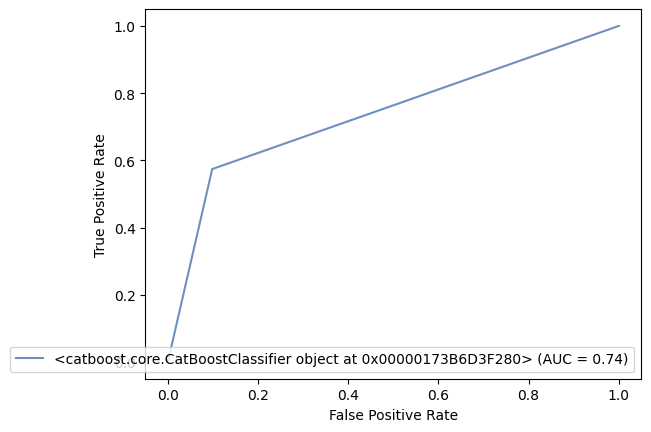

In [186]:
# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_cb)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_cb)
display.plot()
plt.show()

The AUC value is 0.74

The best model based on AUC score is Logistic Regression model, with AUC score of 0.77

### Saving the model

In [187]:
import pickle

In [188]:
filename = 'rainfall_classification_model.pkl'
pickle.dump(model_lr, open(filename, 'wb'))

#### Predicting using the saved model

In [189]:
model = pickle.load(open(filename, 'rb'))

pred = model.predict(x_test)

In [190]:
test_df = pd.DataFrame({'Actual': np.array(y_test), 'Predicted': pred})
test_df

,Actual,Predicted
0,1,1
1,1,1
2,1,0
3,1,0
4,0,0
...,...,...
1848,0,1
1849,0,0
1850,0,0
1851,1,0


In [191]:
test_df.to_csv('rainfall_clf_predictions.csv', index=False)

These are the final predictions

## Part 2: Predicting Rainfall

### Separating features and target

In [192]:
x = df.drop(columns=['Rainfall'])
y = df['Rainfall']

#### Feature scaling

In [193]:
# Importing StandardScaler
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,Location,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,AvgTemp,AvgPressure,AvgHumidity,AvgWindSpeed,AvgCloud
0,-1.385612,-0.002343,0.006311,1.226778,0.558063,1.330182,1.371489,-0.531015,-0.52374,-0.131828,-1.612542,-0.751204,0.903084,0.914423
1,-1.385612,-0.002343,0.006311,1.417476,0.558063,-0.214359,1.594631,-0.531015,-0.52374,-0.177436,-1.294206,-1.508091,-0.213511,0.045231
2,-1.385612,-0.002343,0.006311,1.608174,0.705163,1.330182,1.594631,-0.531015,-0.52374,0.223917,-1.479902,-1.539628,0.965117,-0.495970
3,-1.385612,-0.002343,0.006311,-0.489501,-1.170109,0.447587,-1.752500,-0.531015,-0.52374,0.178309,-0.233084,-1.760387,-0.585709,0.045231
4,-1.385612,-0.002343,0.006311,1.226778,0.330549,-1.317602,-0.190506,-0.531015,-0.52374,0.885238,-1.435689,-0.057390,-0.151478,1.549146


### Checking Variance Inflation Factor (VIF)

In [194]:
# Checking for multicollinearity using Variance Inflation factor
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_values = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif = pd.DataFrame({'Features': x.columns, 'VIF': vif_values})
vif

,Features,VIF
0,Location,1.148675
1,Evaporation,1.690519
2,Sunshine,1.994978
3,WindGustDir,1.496590
4,WindGustSpeed,2.317133
5,WindDir9am,1.223278
6,WindDir3pm,1.337353
7,RainToday,1.308970
8,RainTomorrow,1.389858
9,AvgTemp,1.713148


The VIF values are all below 5, which means there is no multicollinearity at all.

### Model Building

In [195]:
# Importing required libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

#### Splitting data into train and test

In [196]:
# Finding the best random state for splitting the data
max_accu = 0
max_rs = 0
for i in range(0, 200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=i)
    
    lr = LinearRegression()
    lr.fit(x_train, y_train)
    y_pred = lr.predict(x_test)
    accu = r2_score(y_test, y_pred)
    if accu > max_accu:
        max_accu = accu
        max_rs = i
        
print(f'Best accuracy: {max_accu}\nRandom state for best accuracy: {max_rs}')

Best accuracy: 0.8946286002965538
Random state for best accuracy: 176


In [197]:
# Splitting into train-test data using best random state
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=max_rs)

#### Regression models

In [198]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
import xgboost

In [199]:
models = [
    ('Linear Regression', LinearRegression()),
    ('Support Vector Regressor', SVR()),
    ('KNN', KNeighborsRegressor()),
    ('Decision Tree', DecisionTreeRegressor()),
    ('Random Forest', RandomForestRegressor()),
    ('Extra Trees', ExtraTreesRegressor()),
    ('Gradient Boosting', GradientBoostingRegressor()),
    ('Lasso', Lasso()),
    ('Ridge', Ridge()),
    ('XGBoost', xgboost.XGBRegressor())
]

results = []

for model_name, model in models:
    
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    results.append((model_name, mae, rmse, r2))


df_results = pd.DataFrame(results, columns=['Model', 'MAE', 'RMSE', 'R2'])
df_results.sort_values('R2', ascending=False, inplace=True)

df_results

,Model,MAE,RMSE,R2
6,Gradient Boosting,0.043640,0.069714,0.895922
0,Linear Regression,0.046148,0.070146,0.894629
8,Ridge,0.046163,0.070148,0.894621
4,Random Forest,0.045883,0.072231,0.888272
5,Extra Trees,0.046638,0.072801,0.886502
9,XGBoost,0.050649,0.078814,0.866976
2,KNN,0.045088,0.079125,0.865925
1,Support Vector Regressor,0.082135,0.093770,0.811702
3,Decision Tree,0.051729,0.108573,0.747558
7,Lasso,0.187926,0.216125,-0.000298


Gradient Boosting Regressor model seems to have the best R2 score on the test data. The Lasso model has negative R2 score and needs to be discarded.

#### Cross validation

In [200]:
from sklearn.model_selection import cross_val_score

In [201]:
results = []

for model_name, model in models:
    cv_score = cross_val_score(model, x_train, y_train, cv=5, scoring='r2') # Using fold value of 5
    mean_score = cv_score.mean()
    
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    diff = abs(r2 - mean_score)
    
    results.append((model_name, mae, rmse, r2, mean_score, diff))


df_results = pd.DataFrame(results, columns=['Model', 'MAE', 'RMSE', 'R2', 'CV R2', 'Difference'])
df_results.sort_values('Difference', ascending=True, inplace=True)

df_results

,Model,MAE,RMSE,R2,CV R2,Difference
7,Lasso,0.187926,0.216125,-0.000298,-0.001549,0.001250
1,Support Vector Regressor,0.082135,0.093770,0.811702,0.796765,0.014937
9,XGBoost,0.050649,0.078814,0.866976,0.848862,0.018114
5,Extra Trees,0.046985,0.073000,0.885878,0.863273,0.022605
4,Random Forest,0.046289,0.072736,0.886702,0.862602,0.024100
6,Gradient Boosting,0.043645,0.069735,0.895859,0.869191,0.026668
2,KNN,0.045088,0.079125,0.865925,0.838912,0.027013
8,Ridge,0.046163,0.070148,0.894621,0.866572,0.028049
0,Linear Regression,0.046148,0.070146,0.894629,0.866572,0.028057
3,Decision Tree,0.049540,0.105566,0.761347,0.719710,0.041637


The Lasso model has the worst performance for both validation and test data so we need to discard it. The rest of the models all seem to have very less difference between test and croos validation rR2 scores. So, we need to tune all the models and choose the best performing model.

#### Hyperparameter Tuning

In [202]:
from sklearn.model_selection import GridSearchCV

##### Linear Regression

In [203]:
params = {
    'n_jobs': [1, 2, 4, 5, 10, 15, 20, None],
    'fit_intercept': [True, False],
    'positive': [True, False]
}

In [204]:
gcv = GridSearchCV(LinearRegression(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'fit_intercept': [True, False],
                         'n_jobs': [1, 2, 4, 5, 10, 15, 20, None],
                         'positive': [True, False]},
             scoring='r2')

In [205]:
best_params = gcv.best_params_
best_params

{'fit_intercept': True, 'n_jobs': 1, 'positive': False}

In [206]:
model_lr = LinearRegression(**best_params)
model_lr.fit(x_train, y_train)
y_pred = model_lr.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.046147520378389824
Root Mean Squared Error: 0.07014576730990905
R2 Score: 0.8946286002965538


R2 score for Linear Regession is 89.46%

##### Support Vector Regressor

In [209]:
params = {
    'kernel': ['rbf', 'poly'],
    'degree': [1, 2, 3, 4, 5],
    'gamma': ['scale', 'auto']
    }

In [210]:
gcv = GridSearchCV(SVR(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=SVR(),
             param_grid={'degree': [1, 2, 3, 4, 5], 'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly']},
             scoring='r2')

In [211]:
best_params = gcv.best_params_
best_params

{'degree': 3, 'gamma': 'scale', 'kernel': 'poly'}

In [212]:
model_svr = SVR(**best_params)
model_svr.fit(x_train, y_train)
y_pred = model_svr.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.07783834117388658
Root Mean Squared Error: 0.09052752573424291
R2 Score: 0.8244983880751593


R2 score for SVR is 82.45%

##### KNN

In [213]:
params = {
    'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'weights': ['uniform','distance'],
    'metric': ['minkowski','euclidean','manhattan'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p':[1, 2]
    }

In [214]:
gcv = GridSearchCV(KNeighborsRegressor(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'p': [1, 2], 'weights': ['uniform', 'distance']},
             scoring='r2')

In [215]:
best_params = gcv.best_params_
best_params

{'algorithm': 'auto',
 'metric': 'minkowski',
 'n_neighbors': 8,
 'p': 2,
 'weights': 'distance'}

In [216]:
model_knn = KNeighborsRegressor(**best_params)
model_knn.fit(x_train, y_train)
y_pred = model_knn.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.04507740202500323
Root Mean Squared Error: 0.07683774733733707
R2 Score: 0.8735644923054879


The R2 score for KNN model is 87.36%

##### Decision Tree

In [217]:
params = {
    'max_depth': [1, 2, 3, 5, 10, 20, 25, 30],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'criterion': ["squared_error", "absolute_error", "friedman_mse", "poisson"]
    }

In [218]:
gcv = GridSearchCV(DecisionTreeRegressor(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error',
                                       'friedman_mse', 'poisson'],
                         'max_depth': [1, 2, 3, 5, 10, 20, 25, 30],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]},
             scoring='r2')

In [219]:
best_params = gcv.best_params_
best_params

{'criterion': 'poisson', 'max_depth': 3, 'min_samples_leaf': 2}

In [220]:
model_dt = DecisionTreeRegressor(**best_params)
model_dt.fit(x_train, y_train)
y_pred = model_dt.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.04381188739591048
Root Mean Squared Error: 0.0696892525754645
R2 Score: 0.8959956696780504


The R2 score is 89.60%

##### Random Forest

In [221]:
params = {
    'max_depth': [10, 20, 50, 100],
    'min_samples_leaf': [1, 2, 4],
    'min_samples_split': [2, 5, 10],
    'n_estimators': [10, 20, 50, 100, 200],
    'max_features': ['auto', 'sqrt']
    }

In [222]:
gcv = GridSearchCV(RandomForestRegressor(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [10, 20, 50, 100],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [10, 20, 50, 100, 200]},
             scoring='r2')

In [223]:
best_params = gcv.best_params_
best_params

{'max_depth': 10,
 'max_features': 'auto',
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'n_estimators': 100}

In [224]:
model_rf = RandomForestRegressor(**best_params)
model_rf.fit(x_train, y_train)
y_pred = model_rf.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.04332606818275351
Root Mean Squared Error: 0.07016555513875264
R2 Score: 0.8945691422452053


The R2 score is 89.46%

##### Extra Trees

In [225]:
params = {
    'max_depth': [10, 20, 50, 100, 200],
    'min_samples_leaf': [1, 2, 4],
    'n_estimators': [100, 500, 700, 1000],
    }

In [226]:
gcv = GridSearchCV(ExtraTreesRegressor(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'max_depth': [10, 20, 50, 100, 200],
                         'min_samples_leaf': [1, 2, 4],
                         'n_estimators': [100, 500, 700, 1000]},
             scoring='r2')

In [227]:
best_params = gcv.best_params_
best_params

{'max_depth': 10, 'min_samples_leaf': 4, 'n_estimators': 1000}

In [228]:
model_et = ExtraTreesRegressor(**best_params)
model_et.fit(x_train, y_train)
y_pred = model_et.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.043328102357391145
Root Mean Squared Error: 0.06934004800336159
R2 Score: 0.8970353649470113


The R2 score is 89.70%

##### Gradient Boosting

In [229]:
params = {
    "n_estimators": [10, 50, 100, 250, 500],
    "max_depth": [1, 3, 5, 7, 9],
    "learning_rate": [0.01, 0.1, 1, 10, 100],
    "loss": ['squared_error', 'absolute_error', 'huber', 'quantile']
    }

In [230]:
gcv = GridSearchCV(GradientBoostingRegressor(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.01, 0.1, 1, 10, 100],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'max_depth': [1, 3, 5, 7, 9],
                         'n_estimators': [10, 50, 100, 250, 500]},
             scoring='r2')

In [231]:
best_params = gcv.best_params_
best_params

{'learning_rate': 0.1,
 'loss': 'squared_error',
 'max_depth': 3,
 'n_estimators': 50}

In [232]:
model_gb = GradientBoostingRegressor(**best_params)
model_gb.fit(x_train, y_train)
y_pred = model_gb.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.04438341533694888
Root Mean Squared Error: 0.06931317681343924
R2 Score: 0.8971151527822104


The R2 score is 89.71%

##### Ridge Regression

In [233]:
params = {
    'alpha':  np.linspace(0, 0.5, 51),
    'fit_intercept': [True, False],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag', 'saga', 'lbfgs'],
    'positive': [True, False]
}

In [234]:
gcv = GridSearchCV(Ridge(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
       0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
       0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
       0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 ]),
                         'fit_intercept': [True, False],
                         'positive': [True, False],
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag',
                                    'saga', 'lbfgs']},
             scoring='r2')

In [235]:
best_params = gcv.best_params_
best_params

{'alpha': 0.03, 'fit_intercept': True, 'positive': False, 'solver': 'sag'}

In [236]:
model_r = Ridge(**best_params)
model_r.fit(x_train, y_train)
y_pred = model_r.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.04614665851848484
Root Mean Squared Error: 0.0701457388872115
R2 Score: 0.8946286856884151


The R2 score is 89.46%

##### XGBoost

In [237]:
params = {
    'max_depth': [1, 2, 5, 7, 10, 20, 50],
    'learning_rate': [0.001, 0.01, 0.1, 1.0],
    'subsample': [0.2, 0.5, 0.7, 1],
    'n_estimators': [10, 50, 100, 200]
    }

In [238]:
gcv = GridSearchCV(xgboost.XGBRegressor(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1.0],
                         'max_depth': [1, 2, 5, 7, 10, 20, 50],
                         'n_estimators': [10, 50, 100, 200],
                         'subsample': [0.2, 0.5, 0.7, 1]},
             scoring='r2')

In [239]:
best_params = gcv.best_params_
best_params

{'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 100, 'subsample': 0.5}

In [240]:
model_xgb = xgboost.XGBRegressor(**best_params)
model_xgb.fit(x_train, y_train)
y_pred = model_xgb.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.043646964364286917
Root Mean Squared Error: 0.0696494032946294
R2 Score: 0.8961145779077503


The R2 score is 89.61%

**Based on the above models, Gradient Boosting performs the best on this dataset with R2 score of 89.71%**

### Saving the model

In [241]:
# Saving the model
filename = 'rainfall_regression_model.pkl'
pickle.dump(model_gb, open(filename, 'wb'))

#### Predicting using the saved model

In [242]:
model = pickle.load(open(filename, 'rb'))

pred = model.predict(x_test)

In [243]:
test_df = pd.DataFrame({'Actual': np.array(y_test), 'Predicted': pred})
test_df

,Actual,Predicted
0,-0.000000,0.038166
1,-0.000000,0.048123
2,0.547349,0.523053
3,-0.000000,0.077344
4,-0.000000,0.018122
...,...,...
1848,-0.000000,0.064115
1849,-0.000000,0.043542
1850,0.551970,0.508858
1851,-0.000000,0.004186


#### Actual vs Predicted

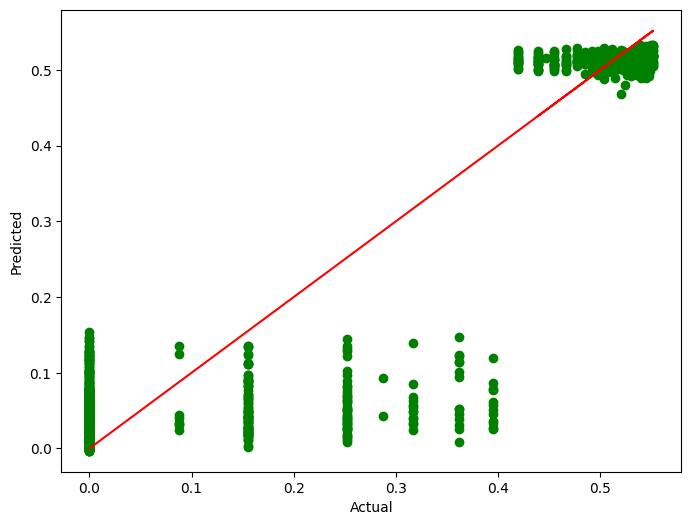

In [244]:
plt.figure(figsize=(8, 6))
plt.scatter(x=y_test, y=pred, color='g')
plt.plot(y_test, y_test, color='r')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()